In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from IPython.display import display
import numpy as np
import os
import torch
from PIL import Image, ImageDraw
from plotly.subplots import make_subplots

# SOMMAIRE

##### [Introduction](#dim)

##### I -  [Experiments setup](#Experiments)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;A - [Methods](#Methodes)    
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;B - [Time to proceed experiment on 1 image](#Timeexp1im)  
##### II -  [Precision Analysis ](#precision)
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; - [Methods comparaison](#Methodes)   
##### III -  [Time](#Time)
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; - [Methods comparaison](#Methodes)   
##### III -  [Complexity](#Complexity)

# <a id="Complexity"></a> Complexity

detailed line by line breakdown of execution time - optimizing code

In [2]:
from line_profiler import LineProfiler

## Many perturbations results

In [17]:
folder_path = "/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/LARDExpe/"
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]
dfs = []
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    df = pd.read_csv(file_path, converters={"bounds_clip":pd.eval,  'IoU_vanilla':pd.eval,'IoU_extension':pd.eval,'IoU_extension_greedy':pd.eval})
    dfs.append(df)
    combined_df = pd.concat(dfs, ignore_index=True)
combined_df["lb_box"] = combined_df["bounds_clip"].apply(lambda x: x[0])
combined_df["lb_box0"] = combined_df["bounds_clip"].apply(lambda x: x[0][0])
combined_df["ub_box"] = combined_df["bounds_clip"].apply(lambda x: x[1])

In [24]:
combined_df["IoU_vanilla_delta"] = combined_df.IoU_vanilla.apply(lambda x: x[1]-x[0])
combined_df["IoU_extension_delta"] = combined_df.IoU_extension.apply(lambda x: x[1]-x[0])

combined_df["Vanilla_upper"] = combined_df.IoU_vanilla.apply(lambda x: x[1])
combined_df["Vanilla_lower"] = combined_df.IoU_vanilla.apply(lambda x: x[0])
combined_df["Extension_upper"] = combined_df.IoU_extension.apply(lambda x: x[1])
combined_df["Extension_lower"] = combined_df.IoU_extension.apply(lambda x: x[0])

In [25]:
eps0 = combined_df[combined_df["eps"]==0]
bad_images_extension = np.unique(eps0[eps0["IoU_extension_delta"]>0.0001]["image_id"])
bad_images_vanilla = np.unique(eps0[eps0["IoU_vanilla_delta"]>0.0001]["image_id"])
def bad_images(im):
    if (im in bad_images_extension) or (im in bad_images_vanilla):
        return(True)
    return(False)


In [26]:
combined_df["bad_images"] = combined_df["image_id"].apply(lambda x: bad_images(x))

In [27]:

combined_df = combined_df[combined_df["bad_images"] == False]

In [28]:
len(np.unique(combined_df["image_id"]))

98

In [29]:
#combined_df = combined_df[combined_df["eps"] <= 0.0009]

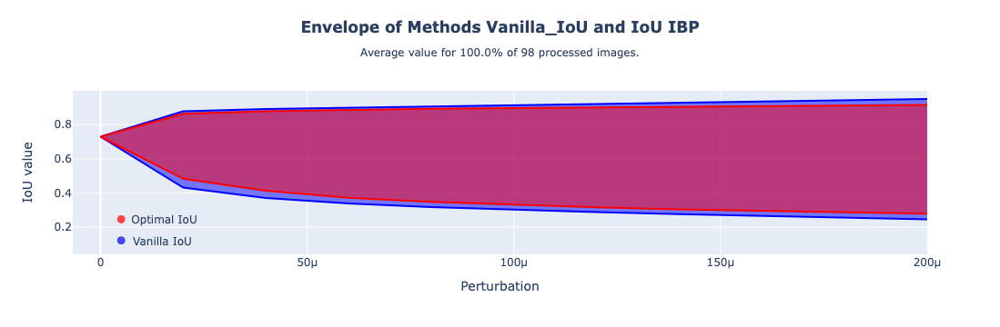

In [30]:
def envelop_graph(df_grouped, eps="eps", title='Envelope of Methods Vanilla_IoU and IoU IBP', subtitle=None, subsubtitle=""):
    """df should have the columns
    "Eps" "Vanilla_upper", "Vanilla_lower", "Extension_upper", "Extension_lower"
    """

    trace_A = go.Scatter(
        x=df_grouped[eps],
        y=df_grouped["Vanilla_upper"],
        fill=None,
        mode='lines',
        line=dict(color='blue'),
        name='Vanilla_IoU Upper Bound', 
        showlegend=False
    )
    trace_A_lower = go.Scatter(
        x=df_grouped[eps],
        y=df_grouped["Vanilla_lower"],
        fill='tonexty',  # Espace remplissage ! 
        mode='lines',
        line=dict(color='blue'),
        name='Vanilla_IoU Lower Bound',
        showlegend=False
    )
    trace_B = go.Scatter(
        x=df_grouped[eps],
        y=df_grouped["Extension_upper"],
        fill=None,
        mode='lines',
        line=dict(color='red'),
        name='IoU_extension Upper Bound',
        showlegend=False
    )
    trace_B_lower = go.Scatter(
        x=df_grouped[eps],
        y=df_grouped["Extension_lower"],
        fill='tonexty',  # Espace remplissage ! 
        mode='lines',
        line=dict(color='red'),
        name='IoU_extension Lower Bound',
        showlegend=False
    )
    
    layout = go.Layout(
        title=title,
        xaxis=dict(title='Perturbation'),
        yaxis=dict(title='IoU value')
    )
    
    fig = go.Figure(layout=layout)
    fig.add_trace(trace_A)
    fig.add_trace(trace_A_lower)
    fig.add_trace(trace_B)
    fig.add_trace(trace_B_lower)

    decalou = (df_grouped["Extension_upper"].max()-df_grouped["Extension_upper"].min())/1.5
    x_vanilla, x_optimal = df_grouped[eps].describe()["25%"]/10, df_grouped[eps].describe()["25%"]/10
    y_vanilla, y_optimal = df_grouped["Vanilla_lower"].min()-decalou, df_grouped["Vanilla_lower"].min()
    decalage = df_grouped[eps].describe()["25%"]/5
    
    fig.add_trace(go.Scatter(
    x=[x_vanilla,x_optimal],
    y=[y_vanilla, y_optimal],
    mode='markers',
    marker=dict(color=['blue', 'red'], size=[10, 10]),  # Ajustez la taille au besoin
    showlegend=False,
    hoverinfo='none'))

    annotations = [
    dict(x=x_vanilla+decalage, y=y_vanilla, xref="x", yref="y",
         text="Vanilla IoU", showarrow=False),
    dict(x=x_optimal+decalage, y=y_optimal, xref="x", yref="y",
         text=" Optimal IoU", showarrow=False)]



    fig.update_layout(annotations=annotations)

    if subtitle != None:
        fig.update_layout(
            title={'text': f'<b>{title}</b><br><sub>{subtitle}</sub><br><sub><i>{subsubtitle}</i></sub>',
           'y':0.9,
           'x':0.5,
           'xanchor': 'center',
           'yanchor': 'top'}
            )


    return(fig)

df_grouped = combined_df.groupby(["eps", "eps_contrast"])[["Vanilla_upper", "Vanilla_lower", "Extension_upper", "Extension_lower"]].agg("mean")
df_grouped = df_grouped.reset_index()

def percentage_value(df_plotted, df=df):
    """Percentage images processed on this plot
    """
    plotted = len(np.unique(list(df_plotted["image_id"])))
    globaldf = len(np.unique(list(df["image_id"])))
    return((plotted/globaldf)*100)
nb_im_proc = combined_df.groupby("image_id")[["eps"]].agg("count").shape[0]
envelop_graph(df_grouped, eps="eps", title=f'Envelope of Methods Vanilla_IoU and IoU IBP', subtitle=f"Average value for {percentage_value(df)}% of {nb_im_proc} processed images.")

In [31]:
df_grouped.columns

Index(['eps', 'eps_contrast', 'Vanilla_upper', 'Vanilla_lower',
       'Extension_upper', 'Extension_lower'],
      dtype='object')

In [32]:
dico_pert={}
for perturbation_i in np.unique(combined_df["perturbation"]):
    dico_pert[perturbation_i] = combined_df[combined_df["perturbation"] == perturbation_i]

In [33]:
dico_pert["brightness"][["Extension_upper", "Extension_lower" ]]

,Extension_upper,Extension_lower
3292,1.000000,0.000000
3271,1.000000,0.548270
3274,1.000000,0.239486
3277,1.000000,0.054033
3280,1.000000,0.000000
...,...,...
181,0.673700,0.668966
184,0.674179,0.668494
187,0.674656,0.668019
190,0.675136,0.667545


In [34]:
dico_pert["whitenoise"][["Extension_upper", "Extension_lower" ]]

,Extension_upper,Extension_lower
3273,1.000000,0.239486
3276,1.000000,0.054033
3279,1.000000,0.000000
3282,1.000000,0.000000
3285,1.000000,0.000000
...,...,...
189,0.781677,0.577352
192,0.797014,0.566461
195,0.812694,0.555774
174,0.710313,0.634634


In [35]:
dico_pert["whitenoise"][dico_pert["whitenoise"]["image_id"] == 56][["image_id", "eps", "Extension_upper", "Extension_lower" ]].sort_values(by="eps").head(6)

,image_id,eps,Extension_upper,Extension_lower
2079,56,0.00000,0.680005,0.680005
2145,56,0.00000,0.679998,0.679998
2112,56,0.00000,0.679998,0.679998
2115,56,0.00002,0.689394,0.670735
2148,56,0.00002,0.689317,0.670822
2082,56,0.00002,1.000000,0.377165


In [36]:
dico_pert["brightness"][dico_pert["brightness"]["image_id"] == 56][["image_id", "eps", "Extension_upper", "Extension_lower" ]].sort_values(by="eps").head(6)

,image_id,eps,Extension_upper,Extension_lower
2113,56,0.00000,0.679998,0.679998
2146,56,0.00000,0.679998,0.679998
2080,56,0.00000,0.680005,0.680005
2083,56,0.00002,1.000000,0.377165
2116,56,0.00002,0.680648,0.679344
2149,56,0.00002,0.680561,0.679442


In [37]:
dico_pert["contrast"].describe()

,Unnamed: 0,image_id,eps,eps_contrast,elapsed_time_perturbation,elapsed_time_eps_computed_ious,tmps_vanilla,tmps_extension,lb_box0,IoU_vanilla_delta,IoU_extension_delta,Vanilla_upper,Vanilla_lower,Extension_upper,Extension_lower
count,3234.000000,3234.000000,3234.000000,3234.000000,3234.000000,3234.000000,3234.000000,3234.000000,3234.000000,3234.000000,3.234000e+03,3234.000000,3234.000000,3234.000000,3234.000000
mean,50.000000,51.367347,0.000100,0.050000,3.190410,0.034432,0.000028,0.004116,46.820271,0.856454,8.252959e-01,0.973395,0.116941,0.967730,0.142434
std,28.570131,28.510902,0.000063,0.031628,4.212695,0.018271,0.000045,0.006616,61.951166,0.309410,3.320868e-01,0.086646,0.242626,0.090779,0.263735
min,2.000000,1.000000,0.000000,0.000000,0.419834,0.004297,0.000000,0.000000,0.000000,0.000000,-2.921906e-08,0.465681,0.000000,0.465681,0.000000
25%,26.000000,27.000000,0.000040,0.020000,0.513981,0.026724,0.000000,0.000000,0.000000,0.960495,8.657994e-01,1.000000,0.000000,1.000000,0.000000
50%,50.000000,51.500000,0.000100,0.050000,0.885643,0.040753,0.000000,0.000000,0.000000,1.000000,1.000000e+00,1.000000,0.000000,1.000000,0.000000
75%,74.000000,76.000000,0.000160,0.080000,5.888639,0.042810,0.000064,0.010433,109.439765,1.000000,1.000000e+00,1.000000,0.039505,1.000000,0.134201
max,98.000000,100.000000,0.000200,0.100000,17.402010,0.069632,0.000142,0.022796,206.990970,1.000000,1.000000e+00,1.000000,0.940279,1.000000,0.940279


In [38]:
df_grouped.columns

Index(['eps', 'eps_contrast', 'Vanilla_upper', 'Vanilla_lower',
       'Extension_upper', 'Extension_lower'],
      dtype='object')

In [39]:
eps_pert_dict = {'brightness':"eps", 'contrast':"eps_contrast", 'whitenoise':"eps"}

In [40]:
for pert, eps_type in eps_pert_dict.items():
    print(pert, eps_type)

brightness eps
contrast eps_contrast
whitenoise eps


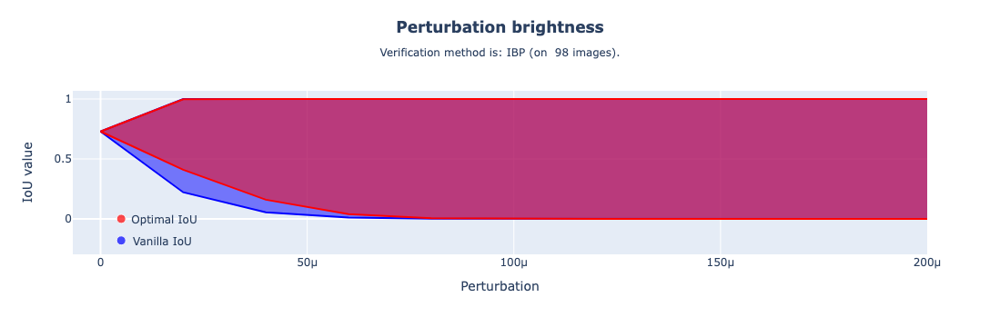

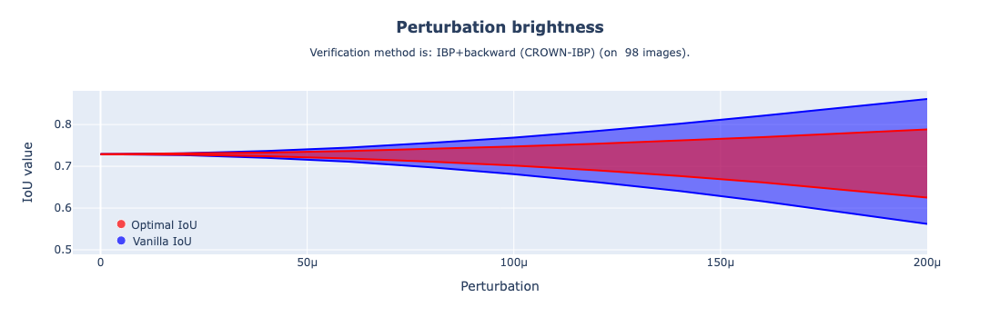

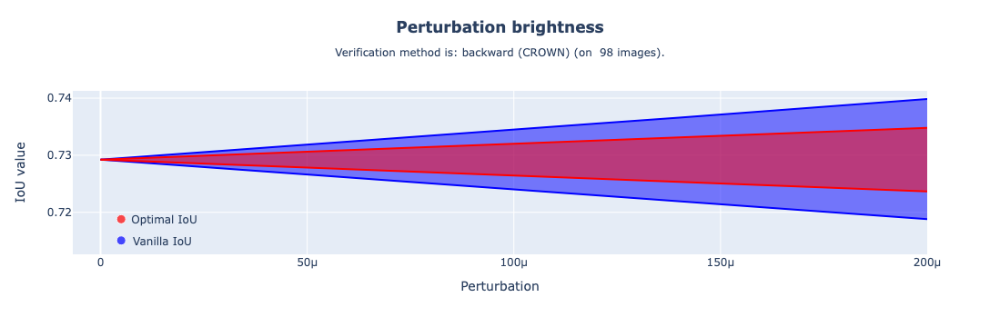

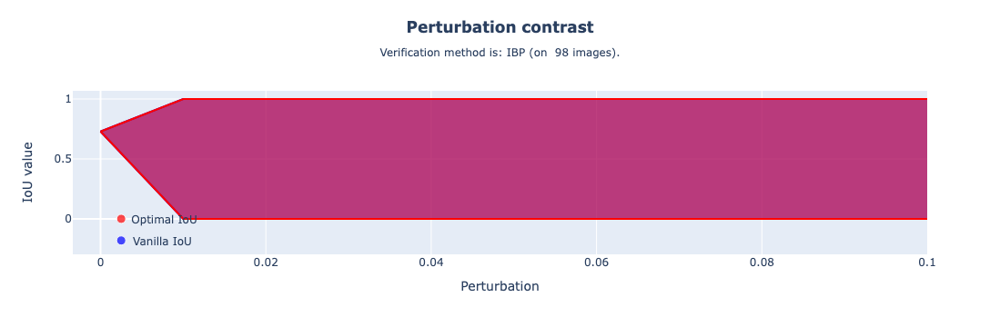

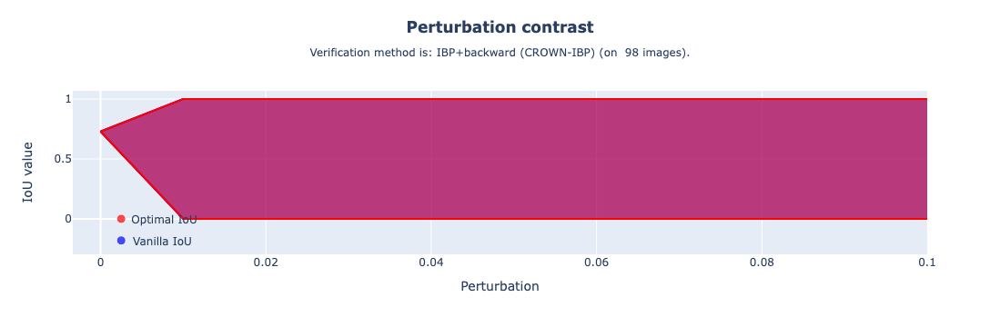

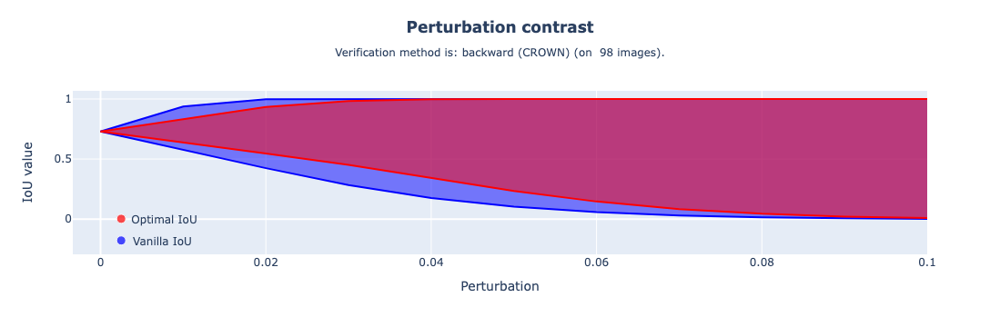

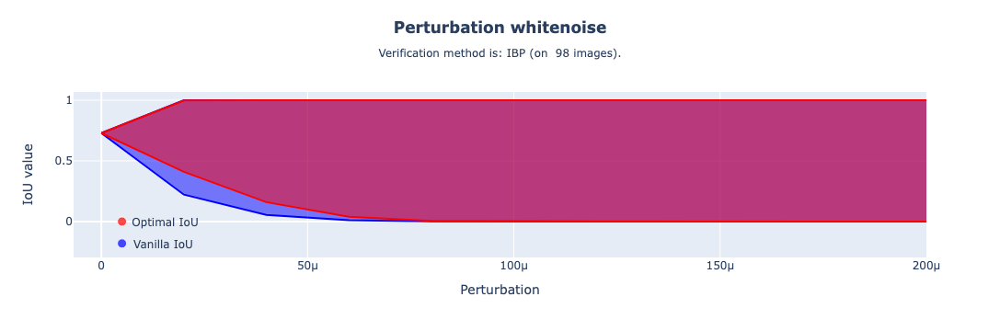

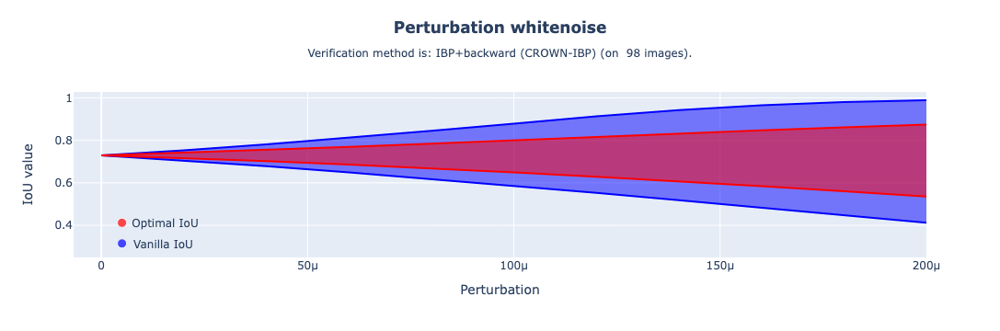

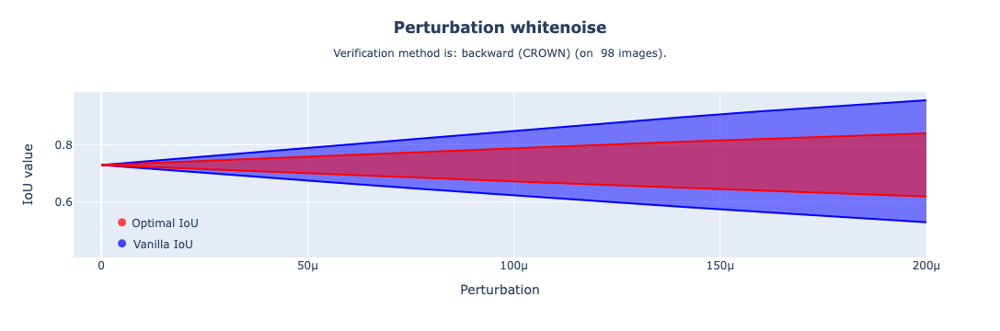

In [41]:
fig_pert_dict = {'brightness':[], 'contrast':[], 'whitenoise':[]}
for pert, eps_type in eps_pert_dict.items():
    for method in np.unique(combined_df.method):
        df_grouped = combined_df[(combined_df["perturbation"] == pert) & (combined_df["method"] == method)].groupby(["eps","eps_contrast"] )[["Vanilla_upper", "Vanilla_lower", "Extension_upper", "Extension_lower"]].agg("mean")
        df_grouped = df_grouped.reset_index()
        nb_im_proc = combined_df[(combined_df["perturbation"] == pert) & (combined_df["method"] == method)].groupby("image_id")[["eps"]].agg("count").shape[0]
        fig = envelop_graph(df_grouped, eps=eps_type, title=f'Perturbation {pert}', subtitle=f"Verification method is: {method} (on  {nb_im_proc} images).")
        fig.show()
        anotations = fig['layout']['annotations']
        fig_pert_dict[pert].append((fig.data, method, anotations))

In [42]:
np.linspace(0, 0.01,11)

array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
       0.009, 0.01 ])

In [43]:
combined_df[(combined_df["perturbation"] == 'contrast') & (combined_df["method"] == 'IBP')].sort_values(by="eps_contrast")

,Unnamed: 0,method,image_id,eps,eps_contrast,fake_iou,perturbation,bounds_clip,elapsed_time_perturbation,elapsed_time_eps_computed_ious,...,lb_box,lb_box0,ub_box,IoU_vanilla_delta,IoU_extension_delta,Vanilla_upper,Vanilla_lower,Extension_upper,Extension_lower,bad_images
3269,2,IBP,1,0.0000,0.0,False,contrast,"[[155.17883, 102.81148, 180.29001, 121.745346]...",0.530364,0.041484,...,"[155.17883, 102.81148, 180.29001, 121.745346]",155.17883,"[155.17883, 102.81148, 180.29001, 121.745346]",0.0,-1.757202e-09,0.904609,0.904609,0.904609,0.904609,False
5447,2,IBP,27,0.0000,0.0,False,contrast,"[[63.81543, 100.89152, 81.63907, 116.36186], [...",0.529676,0.058821,...,"[63.81543, 100.89152, 81.63907, 116.36186]",63.81543,"[63.81543, 100.89152, 81.63907, 116.36186]",0.0,1.006851e-08,0.879763,0.879763,0.879763,0.879763,False
6536,2,IBP,88,0.0000,0.0,False,contrast,"[[134.18208, 129.15158, 143.09633, 139.14137],...",0.498714,0.037822,...,"[134.18208, 129.15158, 143.09633, 139.14137]",134.18208,"[134.18208, 129.15158, 143.09633, 139.14137]",0.0,2.152023e-08,0.551296,0.551296,0.551296,0.551296,False
5546,2,IBP,28,0.0000,0.0,False,contrast,"[[97.47143, 104.07783, 114.60808, 119.10321], ...",0.526008,0.059226,...,"[97.47143, 104.07783, 114.60808, 119.10321]",97.47143,"[97.47143, 104.07783, 114.60808, 119.10321]",0.0,-1.554413e-09,0.907153,0.907153,0.907153,0.907153,False
6635,2,IBP,87,0.0000,0.0,False,contrast,"[[165.83804, 108.77185, 178.14487, 117.48494],...",0.509211,0.037272,...,"[165.83804, 108.77185, 178.14487, 117.48494]",165.83804,"[165.83804, 108.77185, 178.14487, 117.48494]",0.0,-1.735840e-08,0.595831,0.595831,0.595831,0.595831,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2111,32,IBP,56,0.0002,0.1,True,contrast,"[[0, 0, 0, 0], [256, 256, 256, 256]]",0.509716,0.007263,...,"[0, 0, 0, 0]",0.00000,"[256, 256, 256, 256]",1.0,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False
3794,32,IBP,16,0.0002,0.1,True,contrast,"[[0, 0, 0, 0], [256, 256, 256, 256]]",0.513930,0.007202,...,"[0, 0, 0, 0]",0.00000,"[256, 256, 256, 256]",1.0,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False
1517,32,IBP,59,0.0002,0.1,True,contrast,"[[0, 0, 0, 0], [256, 256, 256, 256]]",0.506296,0.007191,...,"[0, 0, 0, 0]",0.00000,"[256, 256, 256, 256]",1.0,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False
8447,32,IBP,94,0.0002,0.1,True,contrast,"[[0, 0, 0, 0], [256, 256, 256, 256]]",0.453961,0.004623,...,"[0, 0, 0, 0]",0.00000,"[256, 256, 256, 256]",1.0,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False


In [44]:
pretty_names = {'brightness':'Brightness', 'contrast':'Contrast', 'whitenoise':'Whitenoise'}

In [45]:
fig_pert_dict_subplot = {}

for pert in fig_pert_dict.keys():
    fig = make_subplots(rows=3, cols=1, vertical_spacing=0.02)
    for i in range(len(fig_pert_dict[pert])):
        fig_i, method_i, annotation_i = fig_pert_dict[pert][i][0], fig_pert_dict[pert][i][1], fig_pert_dict[pert][i][2]
        for trace in fig_i:
            fig.add_trace(trace, row=1+i, col=1)
            fig.update_yaxes(title_text=method_i, row=1+i, col=1)
            
                
            #fig.update_layout(annotations=annotation_i)
            #fig['layout']['annotations'] = annotation_i
    fig.update_layout(height=1000, width=800)
    fig.update_xaxes(title_text=f"{pretty_names[pert]} perturbation", row=3, col=1)
    fig_pert_dict_subplot[pert] = fig

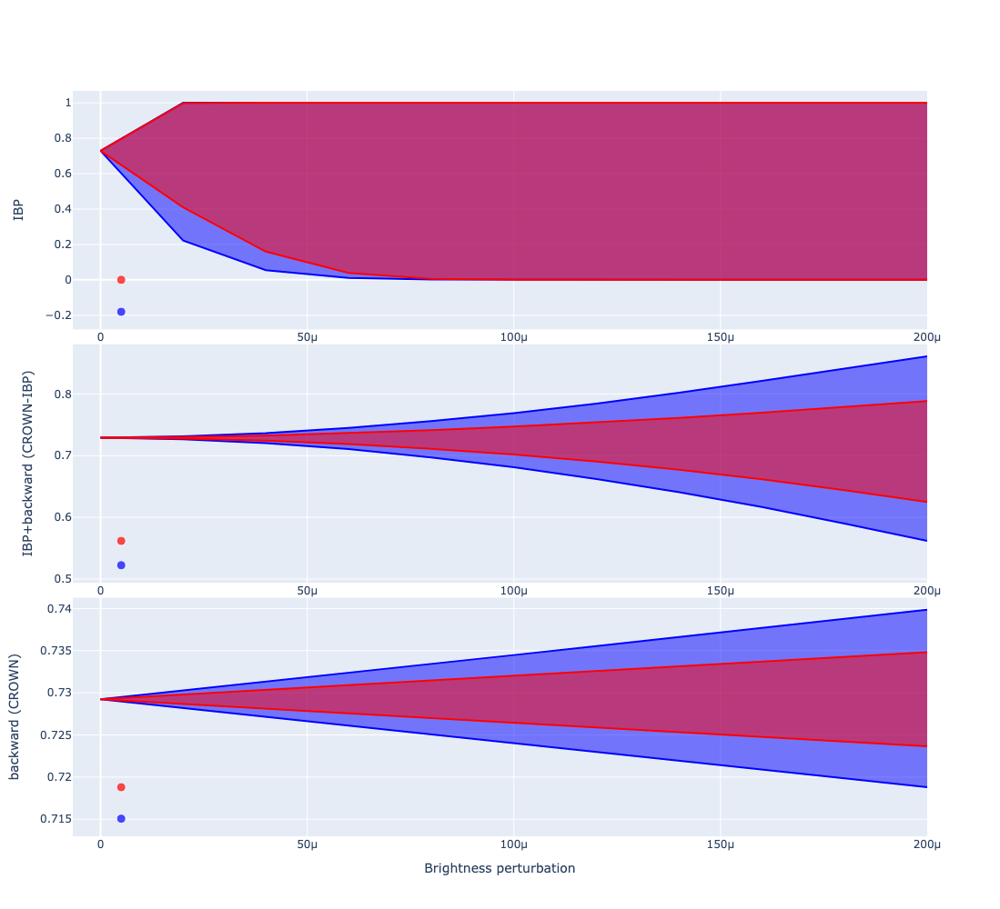

In [46]:
fig_1 = fig_pert_dict_subplot['brightness']
fig_1

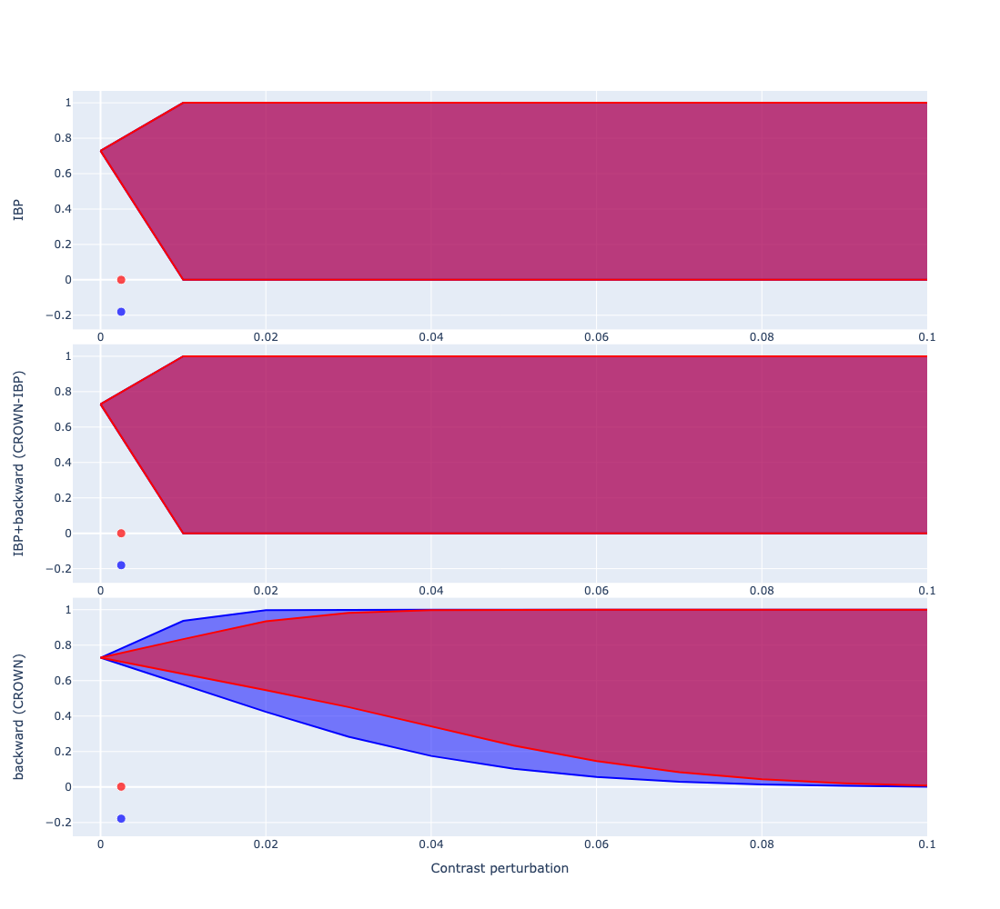

In [47]:
fig_pert_dict_subplot['contrast']

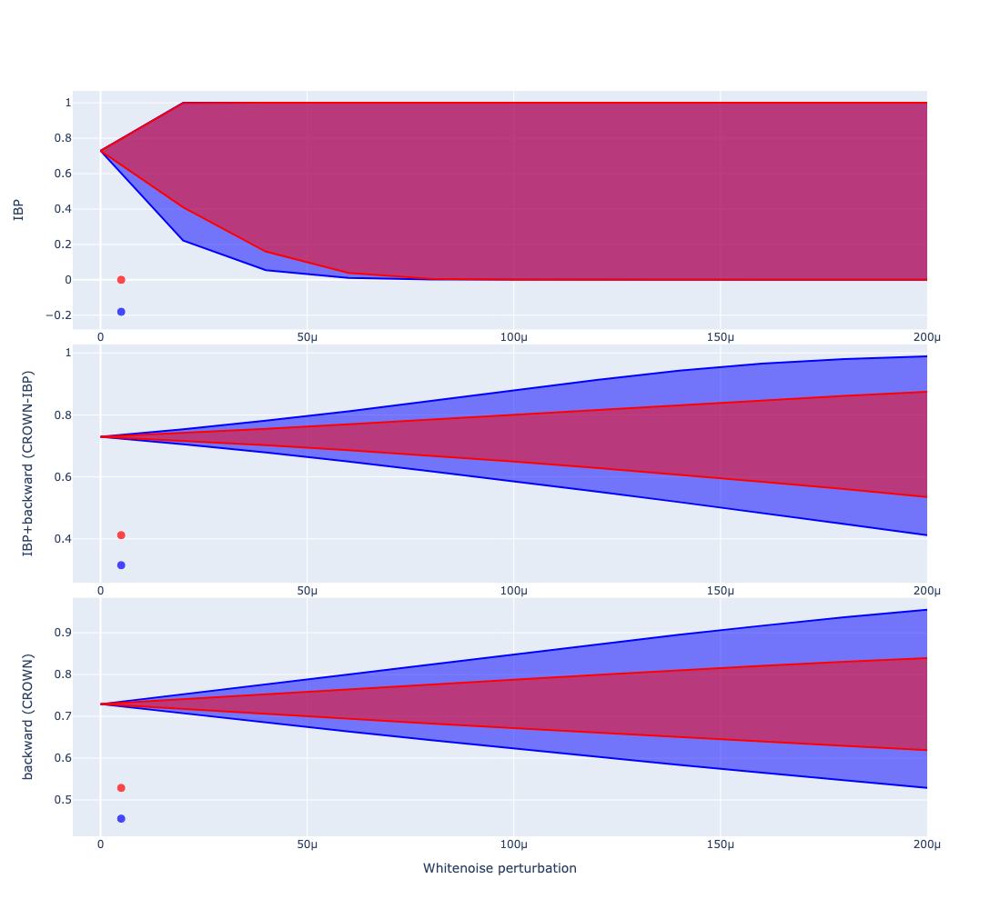

In [48]:
fig_pert_dict_subplot['whitenoise']

## Other section

In [49]:
images = pd.read_csv("/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/many_exp_true/infos/images.csv")

In [50]:
images.head(3)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,8090,8091,8092,8093,8094,8095,8096,8097,8098,8099
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
def display_im(idx):
    im4 = torch.tensor([images.iloc[idx][1:]])
    im4 = im4.view((-1, 1, 90, 90))
    im4 = im4.squeeze()
    im4 = im4.mul(255).byte()
    pil_image = Image.fromarray(im4.cpu().numpy(), mode="L")
    draw = ImageDraw.Draw(pil_image)
    return(pil_image)

/var/folders/85/rkcmsdf568q3lwnpbg8swry40000gn/T/ipykernel_18293/1646365034.py:2: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



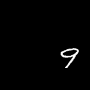

In [52]:
display_im(3)

# <a id="Time"></a> Time analysis

In [53]:
combined_df.melt(value_vars=['elapsed_time_perturbation', 'method'], var_name='Time', value_name='Value')

,Time,Value
0,elapsed_time_perturbation,0.530364
1,elapsed_time_perturbation,0.468569
2,elapsed_time_perturbation,0.562232
3,elapsed_time_perturbation,0.562232
4,elapsed_time_perturbation,0.494125
...,...,...
19399,method,backward (CROWN)
19400,method,backward (CROWN)
19401,method,backward (CROWN)
19402,method,backward (CROWN)


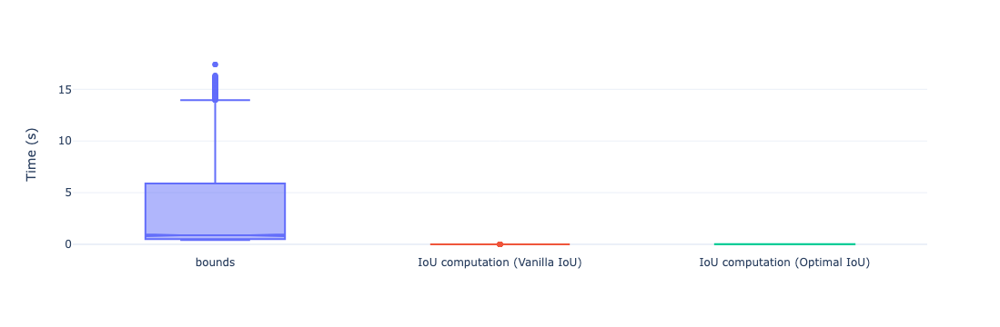

In [72]:
def create_box_plot(df, columns, return_V=False, without_melt=False, y_axes='Time (s)'):
    if without_melt==False:
        df = df.melt(value_vars=columns, var_name='Time', value_name='Value')
    fig = px.box(df, x='Time', y='Value', color='Time', 
                 notched=True,  
                 title='')

    fig.update_layout(
        yaxis_title=y_axes,  
        xaxis_title='',
        template='plotly_white',  
        showlegend=False  
    )
    if return_V==True:
        return(df)
    fig.show()

create_box_plot(combined_df.rename(columns={
    'elapsed_time_perturbation':'bounds',
    "tmps_vanilla":'IoU computation (Vanilla IoU)',
    "tmps_extension":'IoU computation (Optimal IoU)'}), ['bounds', 'IoU computation (Vanilla IoU)',	'IoU computation (Optimal IoU)'])

In [73]:
np.unique(combined_df["method"])

array(['IBP', 'IBP+backward (CROWN-IBP)', 'backward (CROWN)'],
      dtype=object)

In [74]:
ious_ = create_box_plot(combined_df.rename(columns={
    "tmps_vanilla":'Vanilla IoU',
    "tmps_extension":'Optimal IoU'}), ['Optimal IoU', 'Vanilla IoU'], return_V=True)

df_CROWN_IBP = create_box_plot(combined_df[combined_df["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
    'elapsed_time_perturbation':'bounds (CROWN-IBP)',
    "tmps_vanilla":'Vanilla IoU',
    "tmps_extension":'Optimal IoU'}), ['bounds (CROWN-IBP)'], return_V=True)
df_CROWN = create_box_plot(combined_df[combined_df["method"] == 'backward (CROWN)'].rename(columns={
    'elapsed_time_perturbation':'bounds (CROWN)',
    "tmps_vanilla":'Vanilla IoU',
    "tmps_extension":'Optimal IoU'}), ['bounds (CROWN)'], return_V=True)
df_IBP = create_box_plot(combined_df[combined_df["method"] == 'IBP'].rename(columns={
    'elapsed_time_perturbation':'bounds (IBP)',
    "tmps_vanilla":'Vanilla IoU',
    "tmps_extension":'Optimal IoU'}), ['bounds (IBP)'], return_V=True)

In [75]:
#concat_methods = pd.concat([df_CROWN_IBP, df_CROWN, df_IBP, ious_])
concat_methods = pd.concat([df_CROWN_IBP,df_IBP, ious_])

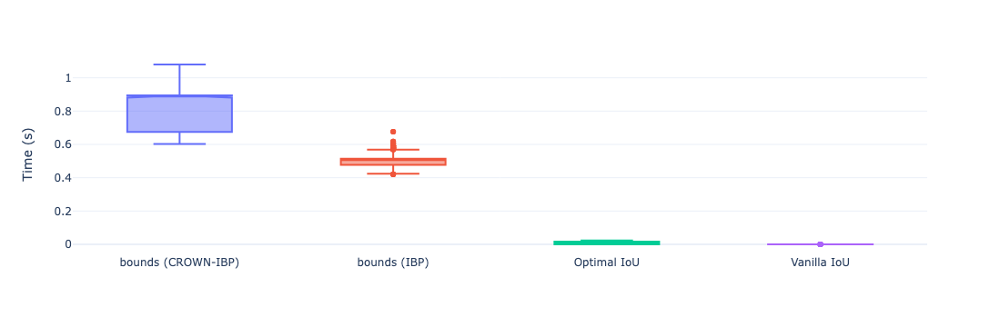

In [76]:
create_box_plot(concat_methods, columns=[""], return_V=False, without_melt=True)

In [77]:
combined_df["Extension_lower"]

3269    0.904609
3342    0.871308
3341    0.818025
3340    0.903201
3339    0.882312
          ...   
128     0.000000
127     0.000000
126     0.000000
124     0.000000
197     0.000000
Name: Extension_lower, Length: 9702, dtype: float64

In [78]:
np.unique(combined_df["perturbation"])

array(['brightness', 'contrast', 'whitenoise'], dtype=object)

epsilon 0.0


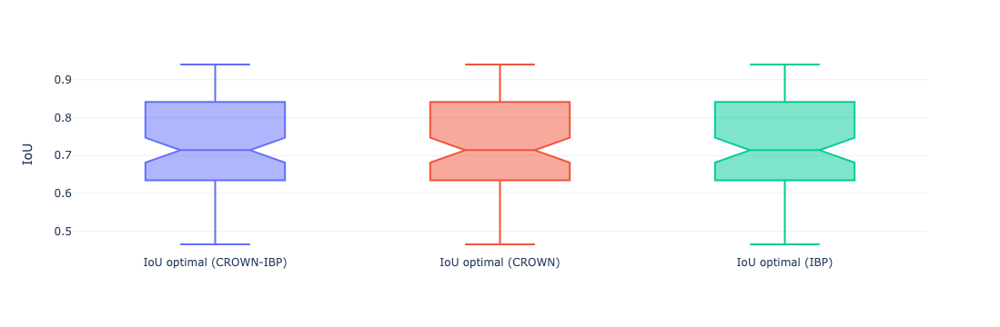

epsilon 2e-05


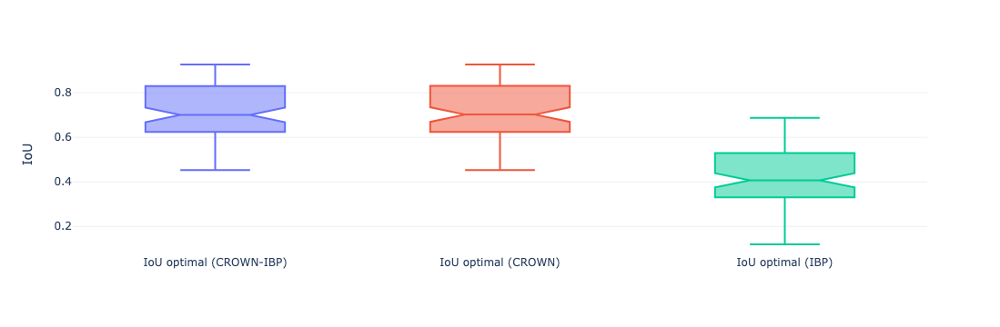

epsilon 4e-05


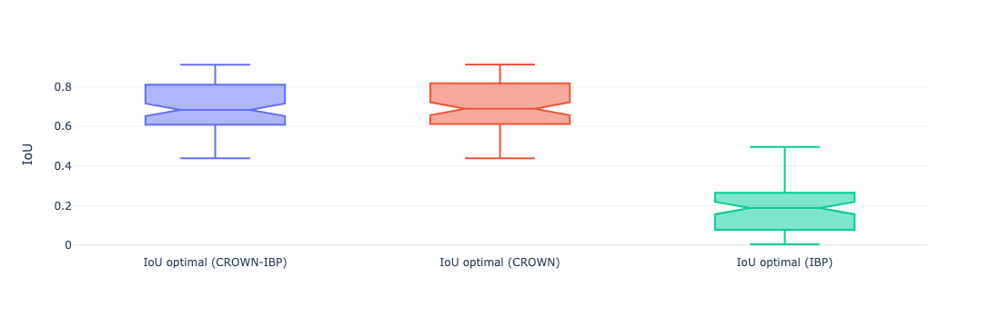

epsilon 6.000000000000001e-05


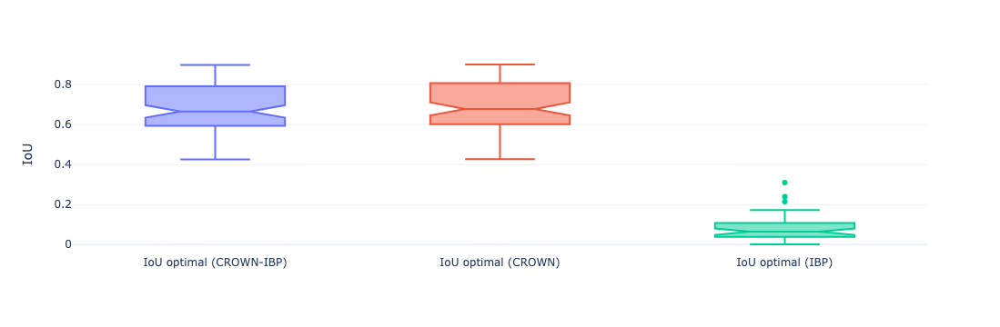

epsilon 8e-05


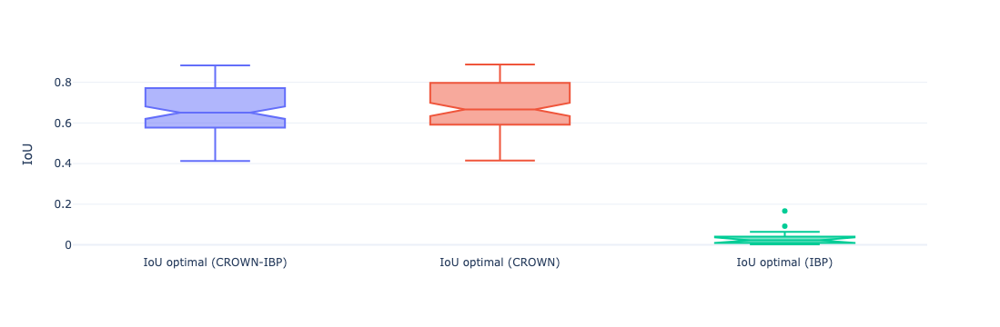

epsilon 0.0001


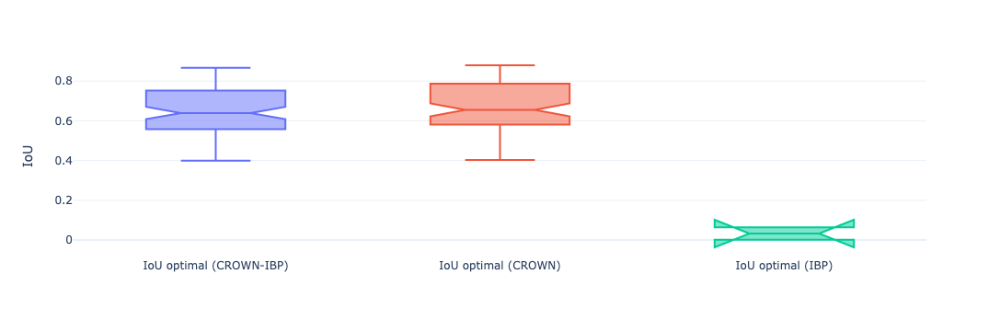

epsilon 0.00012


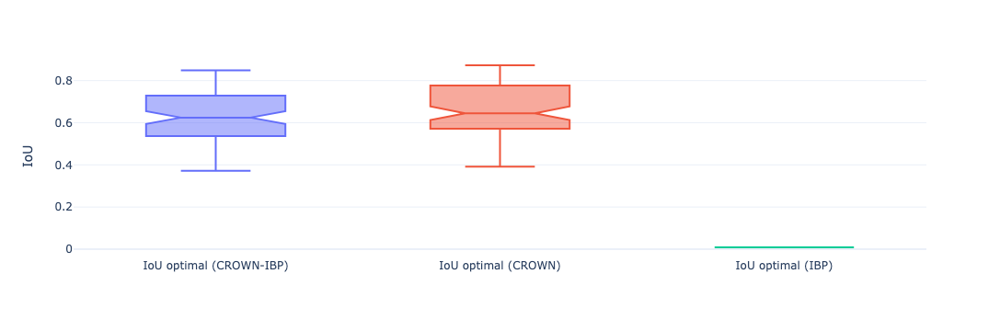

epsilon 0.00014


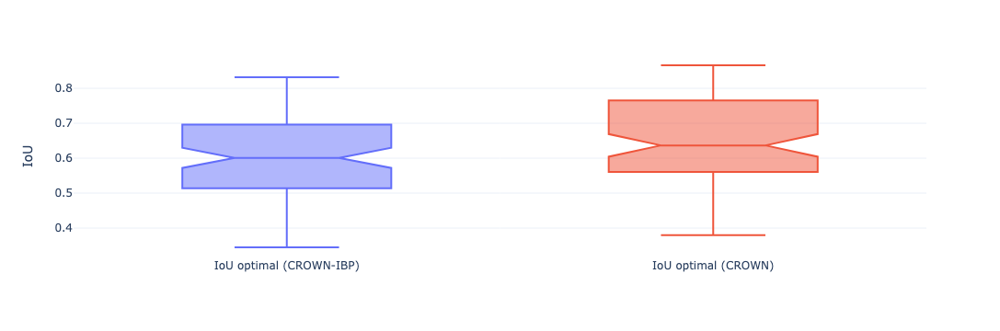

epsilon 0.00016


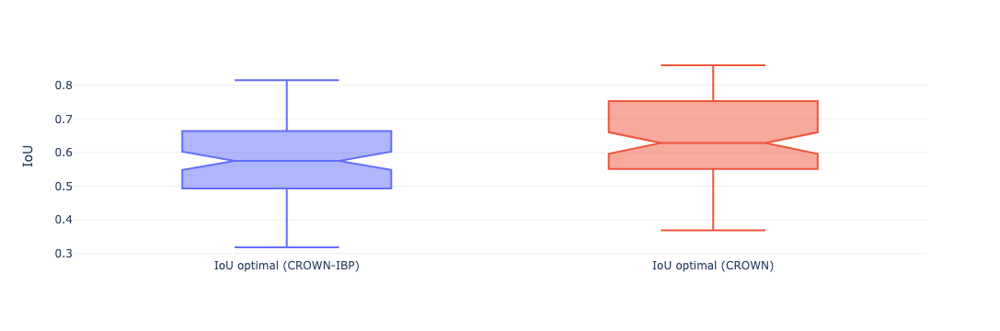

epsilon 0.00018


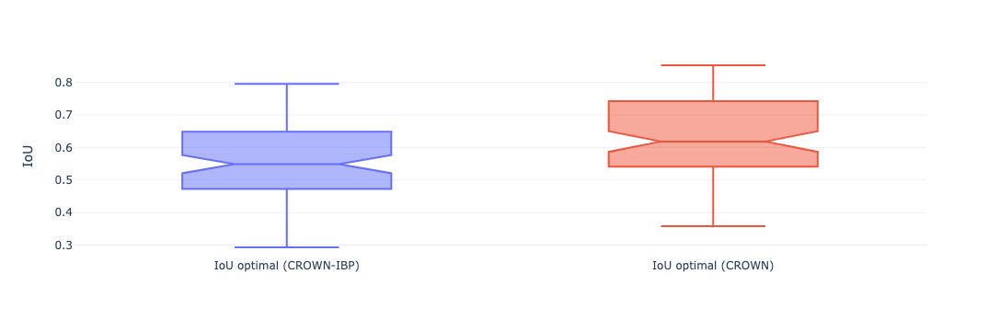

epsilon 0.0002


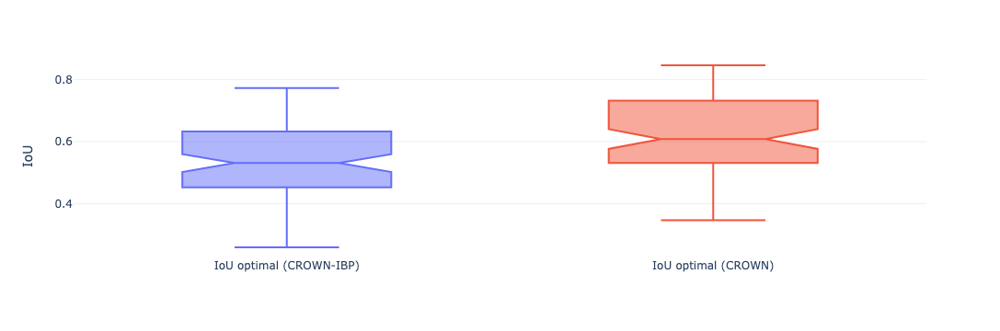

In [79]:
for eps in np.unique(combined_df["eps"]):
    print("epsilon", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==eps) & (combined_df["perturbation"]=="whitenoise")]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Extension_lower":'IoU optimal (CROWN-IBP)'}), ['IoU optimal (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Extension_lower":'IoU optimal (CROWN)'}), ['IoU optimal (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Extension_lower":'IoU optimal (IBP)'}), ['IoU optimal (IBP)'], return_V=True)
    
    ious = pd.concat([df_CROWN_IBP_iou, df_CROWN_iou, df_IBP_iou])
    
    create_box_plot(ious, columns=[""], return_V=False, without_melt=True, y_axes='IoU')

epsilon 0.0


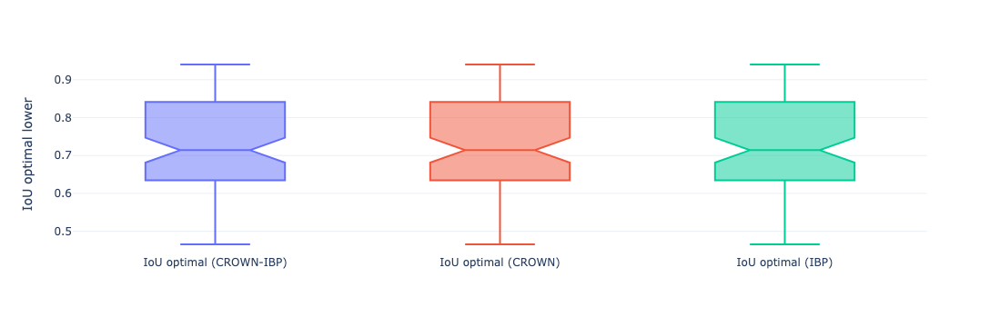

epsilon 2e-05


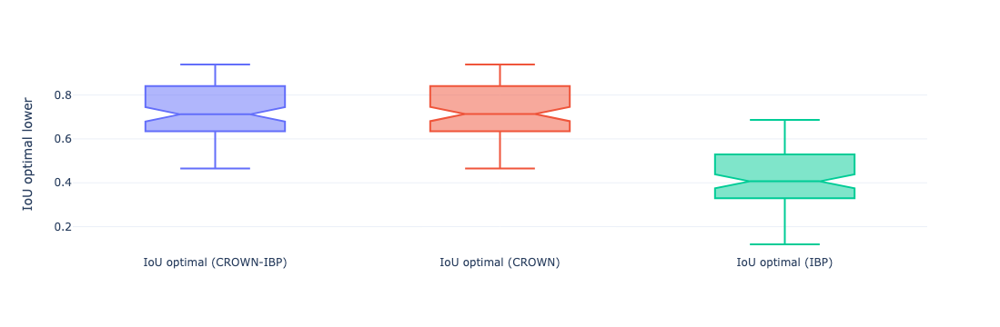

epsilon 4e-05


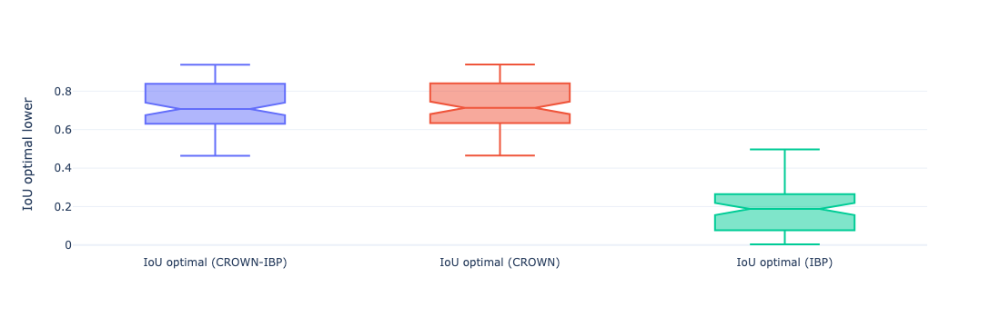

epsilon 6.000000000000001e-05


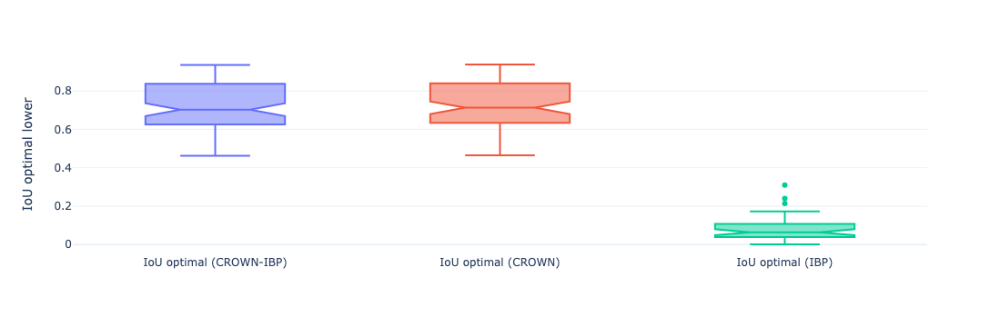

epsilon 8e-05


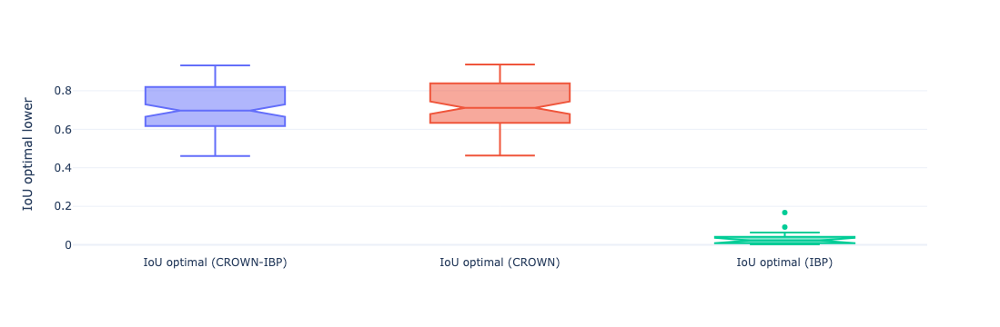

epsilon 0.0001


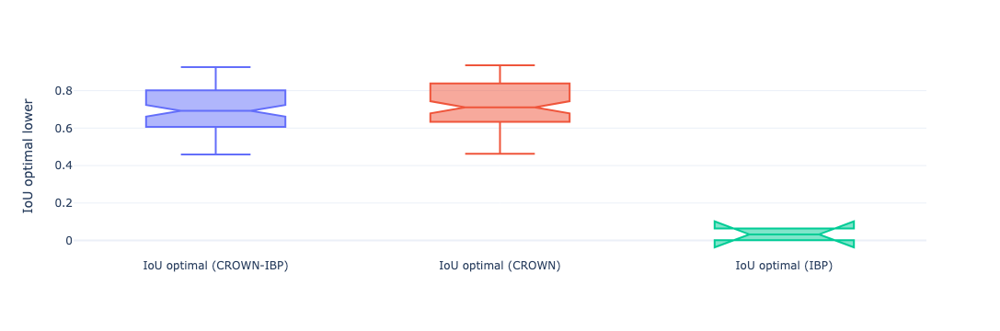

epsilon 0.00012


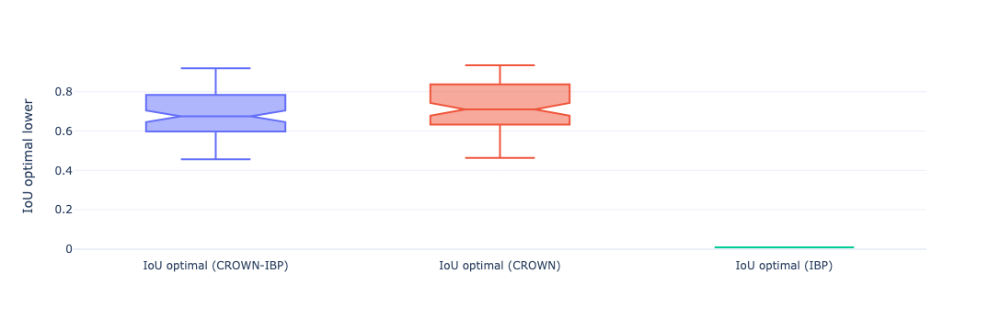

epsilon 0.00014


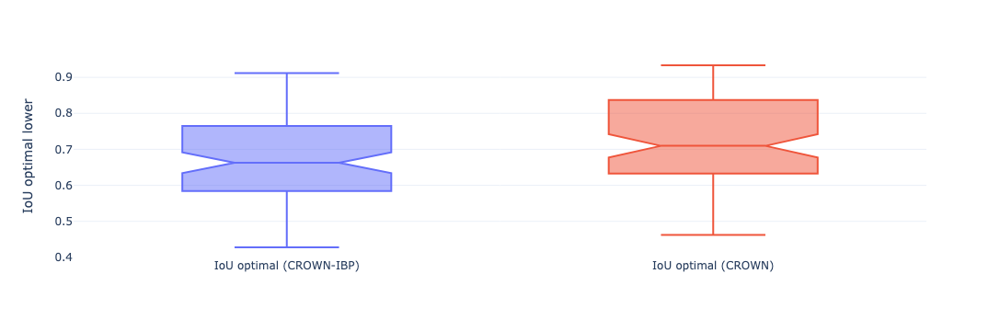

epsilon 0.00016


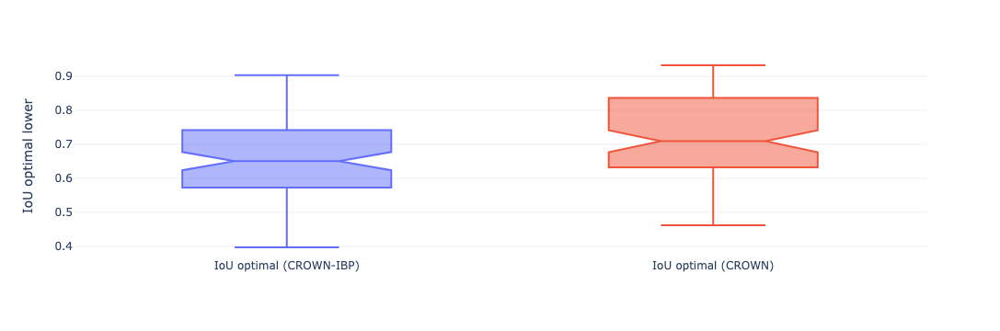

epsilon 0.00018


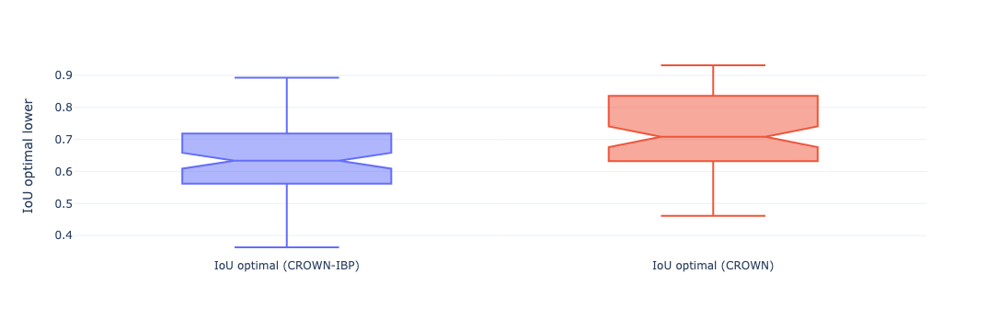

epsilon 0.0002


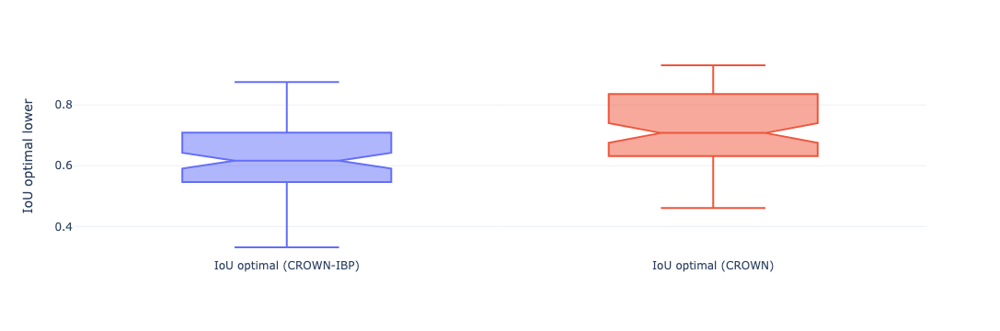

In [80]:

for eps in np.unique(combined_df["eps"]):
    print("epsilon", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==eps) & (combined_df["perturbation"]=="brightness")]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Extension_lower":'IoU optimal (CROWN-IBP)'}), ['IoU optimal (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Extension_lower":'IoU optimal (CROWN)'}), ['IoU optimal (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Extension_lower":'IoU optimal (IBP)'}), ['IoU optimal (IBP)'], return_V=True)
    
    ious = pd.concat([df_CROWN_IBP_iou, df_CROWN_iou, df_IBP_iou])
    
    create_box_plot(ious, columns=[""], return_V=False, without_melt=True, y_axes='IoU optimal lower')

epsilon_contrast 0.0


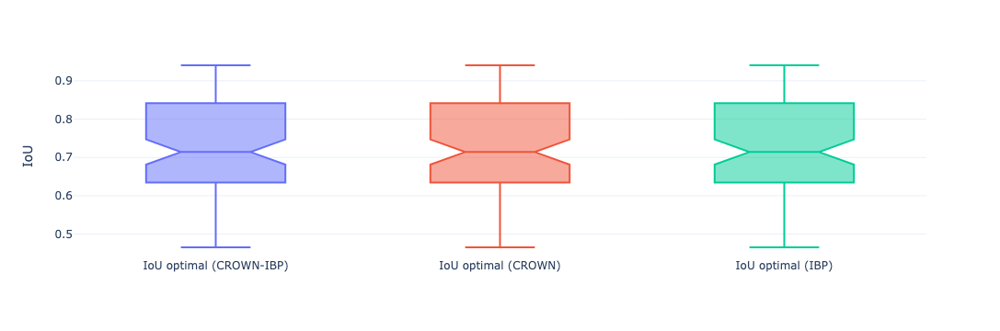

epsilon_contrast 0.01


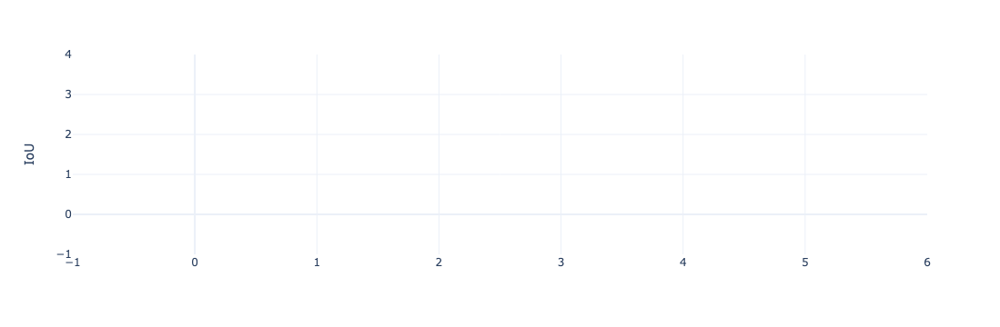

epsilon_contrast 0.02


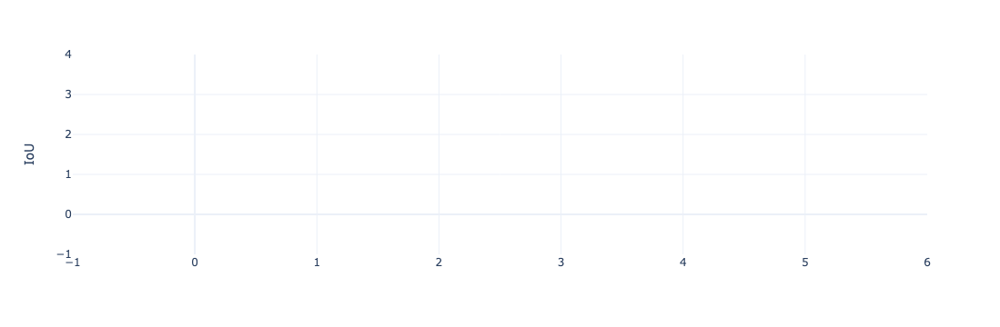

epsilon_contrast 0.03


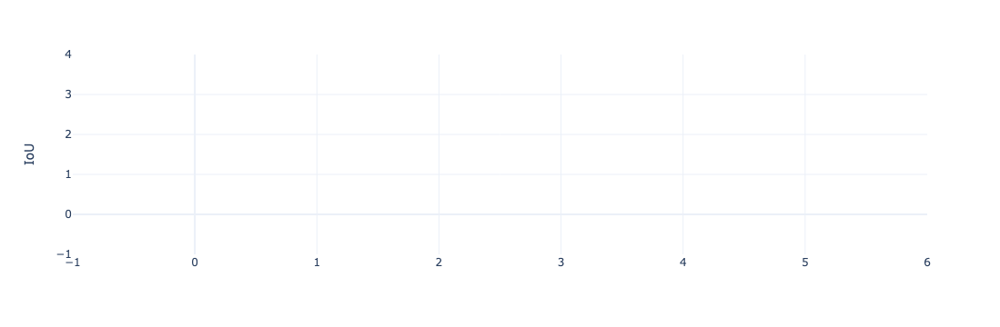

epsilon_contrast 0.04


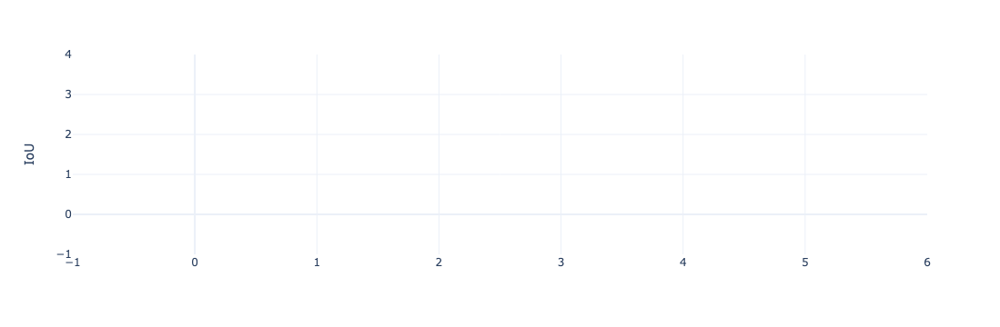

epsilon_contrast 0.05


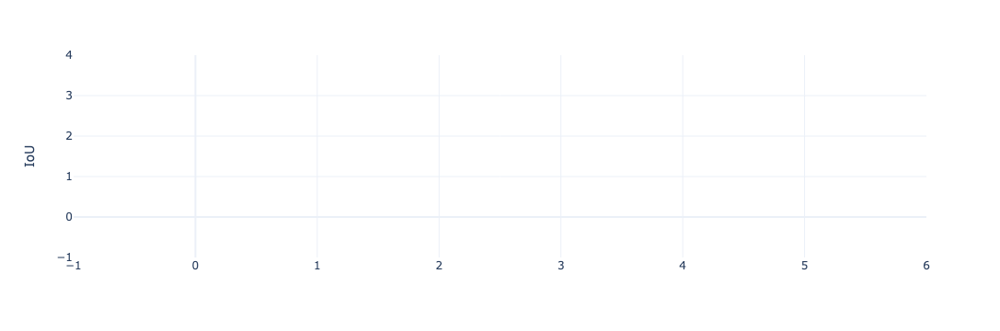

epsilon_contrast 0.06


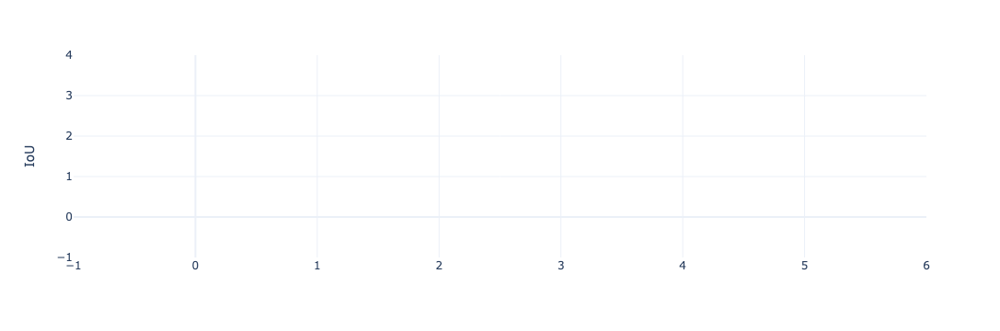

epsilon_contrast 0.07


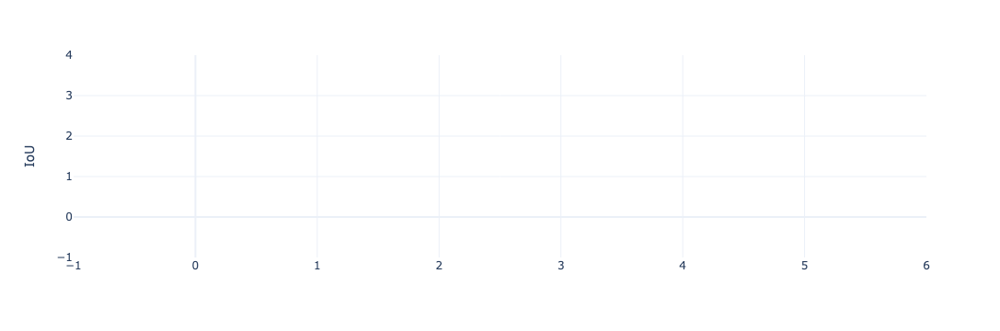

epsilon_contrast 0.08


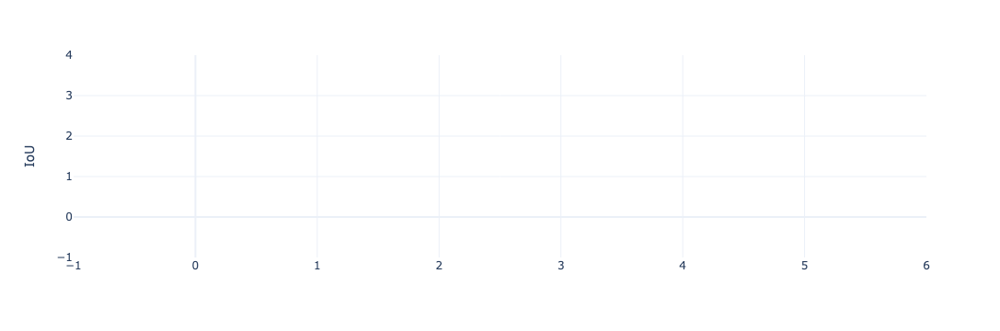

epsilon_contrast 0.09


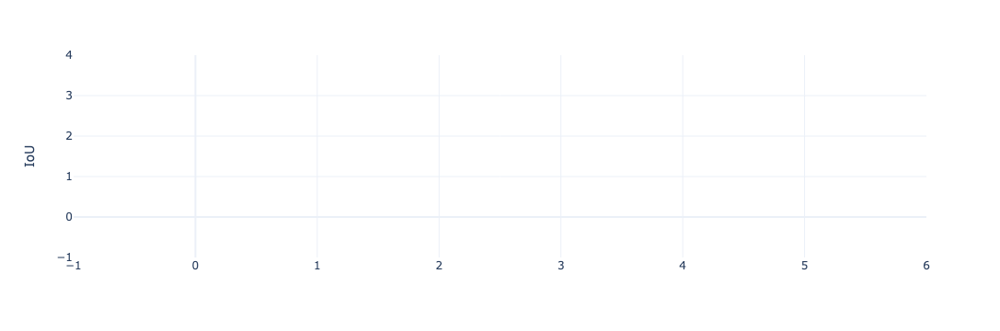

epsilon_contrast 0.1


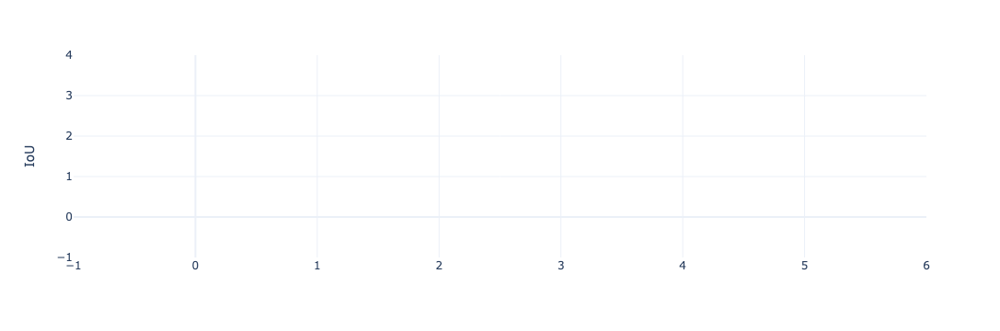

In [81]:
for eps in np.unique(combined_df["eps_contrast"]):
    print("epsilon_contrast", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==eps) & (combined_df["perturbation"]=="contrast")]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Extension_lower":'IoU optimal (CROWN-IBP)'}), ['IoU optimal (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Extension_lower":'IoU optimal (CROWN)'}), ['IoU optimal (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Extension_lower":'IoU optimal (IBP)'}), ['IoU optimal (IBP)'], return_V=True)
    
    ious = pd.concat([df_CROWN_IBP_iou, df_CROWN_iou, df_IBP_iou])
    
    create_box_plot(ious, columns=[""], return_V=False, without_melt=True, y_axes='IoU')

In [82]:
combined_df[(combined_df["fake_iou"]==False)  & (combined_df["perturbation"]=="contrast")].describe()

,Unnamed: 0,image_id,eps,eps_contrast,elapsed_time_perturbation,elapsed_time_eps_computed_ious,tmps_vanilla,tmps_extension,lb_box0,IoU_vanilla_delta,IoU_extension_delta,Vanilla_upper,Vanilla_lower,Extension_upper,Extension_lower
count,937.000000,937.000000,937.000000,937.000000,937.000000,937.000000,937.000000,937.000000,937.000000,937.000000,9.370000e+02,937.000000,937.000000,937.000000,937.000000
mean,66.136606,46.463180,0.000057,0.028303,5.757275,0.052708,0.000095,0.014207,119.524123,0.504558,3.970192e-01,0.908174,0.403616,0.888621,0.491602
std,26.591370,28.382141,0.000055,0.027550,4.078555,0.010030,0.000023,0.002775,35.224049,0.395149,3.498585e-01,0.141196,0.295806,0.140156,0.261565
min,2.000000,1.000000,0.000000,0.000000,0.463709,0.036736,0.000061,0.010081,41.770866,0.000000,-2.921906e-08,0.465681,0.000017,0.465681,0.000071
25%,68.000000,22.000000,0.000000,0.000000,0.903269,0.040737,0.000069,0.010866,95.217250,0.000000,1.226654e-08,0.840280,0.108526,0.782240,0.281337
50%,74.000000,44.000000,0.000040,0.020000,5.933564,0.059260,0.000111,0.016270,122.679650,0.596571,3.738367e-01,1.000000,0.392557,0.969970,0.536584
75%,83.000000,70.000000,0.000100,0.050000,9.210957,0.060144,0.000112,0.016335,144.849690,0.891474,7.127215e-01,1.000000,0.663729,1.000000,0.688290
max,98.000000,100.000000,0.000200,0.100000,15.407359,0.069632,0.000142,0.022796,206.990970,0.999983,9.999293e-01,1.000000,0.940279,1.000000,0.940279


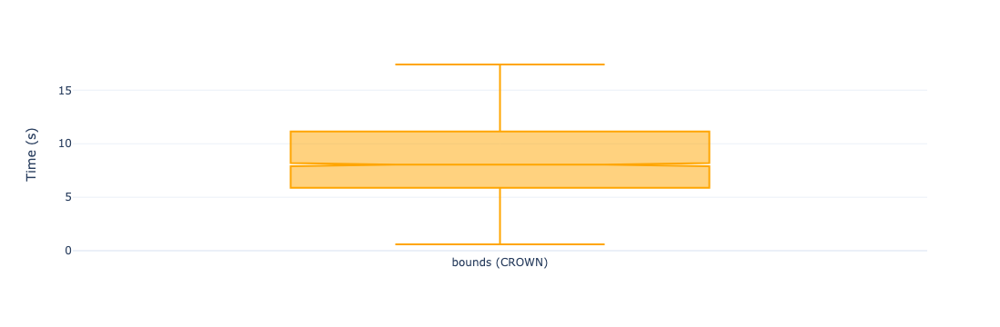

In [83]:
fig = px.box(df_CROWN, x='Time', y='Value', color='Time', 
             notched=True,  
             title='')

fig.update_layout(
    yaxis_title='Time (s)',  
    xaxis_title='',
    template='plotly_white',  
    showlegend=False  
)

fig.update_traces(marker_color='orange', line_color='orange')

epsilon 0.1
epsilon 0.1


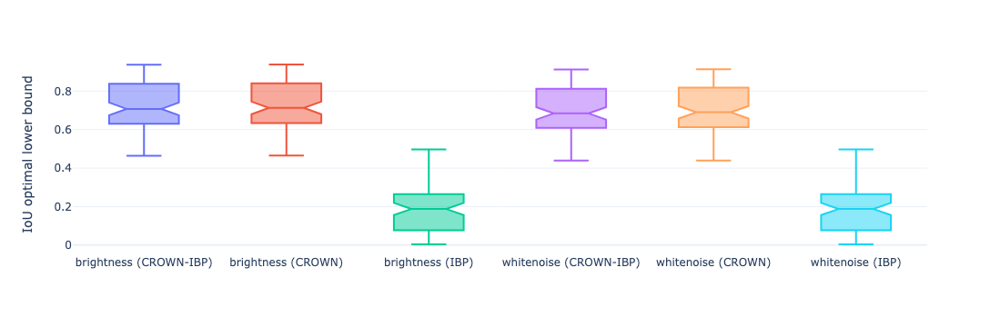

In [98]:
list_bri_white = []
for pert in ["brightness", "whitenoise"]:
    print("epsilon", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==0.00004) & (combined_df["perturbation"]==pert)]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Extension_lower":f'{pert} (CROWN-IBP)'}), [f'{pert} (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Extension_lower":f'{pert} (CROWN)'}), [f'{pert} (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Extension_lower":f'{pert} (IBP)'}), [f'{pert} (IBP)'], return_V=True)
    list_bri_white.append(df_CROWN_IBP_iou)
    list_bri_white.append(df_CROWN_iou)
    list_bri_white.append(df_IBP_iou)
    
ious_bri_white = pd.concat(list_bri_white)
create_box_plot(ious_bri_white, columns=[""], return_V=False, without_melt=True, y_axes='IoU optimal lower bound')

epsilon 0.1
epsilon 0.1


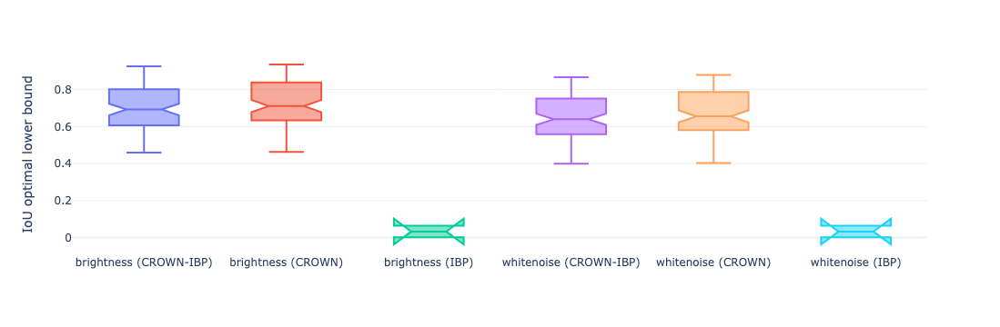

In [107]:
list_bri_white = []
for pert in ["brightness", "whitenoise"]:
    print("epsilon", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==0.0001) & (combined_df["perturbation"]==pert)]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Extension_lower":f'{pert} (CROWN-IBP)'}), [f'{pert} (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Extension_lower":f'{pert} (CROWN)'}), [f'{pert} (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Extension_lower":f'{pert} (IBP)'}), [f'{pert} (IBP)'], return_V=True)
    list_bri_white.append(df_CROWN_IBP_iou)
    list_bri_white.append(df_CROWN_iou)
    list_bri_white.append(df_IBP_iou)
    
ious_bri_white = pd.concat(list_bri_white)
create_box_plot(ious_bri_white, columns=[""], return_V=False, without_melt=True, y_axes='IoU optimal lower bound')

In [102]:
for i in np.unique(combined_df[(combined_df["fake_iou"]==False)  & (combined_df["perturbation"]=='brightness')]["eps"]):
    print(i)

0.0
2e-05
4e-05
6.000000000000001e-05
8e-05
0.0001
0.00012
0.00014
0.00016
0.00018
0.0002


In [101]:
ious_bri_white

,Time,Value
0,brightness (CROWN-IBP),0.886007
1,brightness (CROWN-IBP),0.909841
2,brightness (CROWN-IBP),0.931654
3,brightness (CROWN-IBP),0.839521
4,brightness (CROWN-IBP),0.849459
...,...,...
81,whitenoise (IBP),0.077504
82,whitenoise (IBP),0.205353
83,whitenoise (IBP),0.064204
84,whitenoise (IBP),0.020010


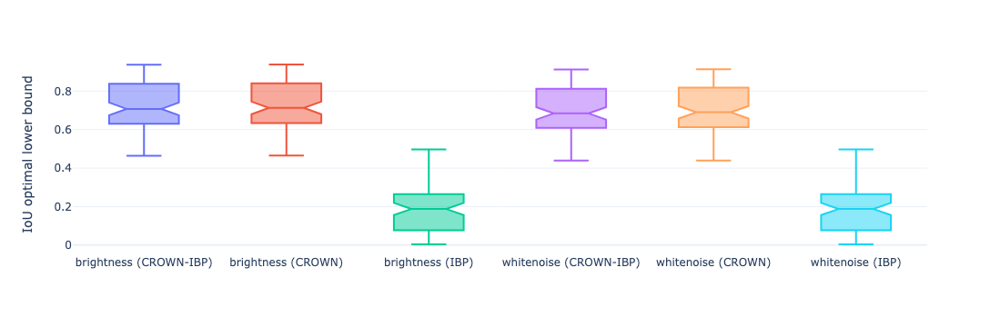

epsilon 0.0002
epsilon 0.0002


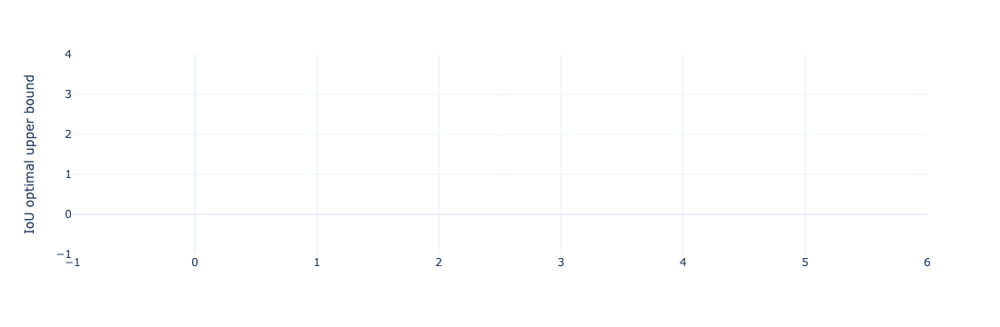

In [50]:
list_bri_white = []
for pert in ["brightness", "whitenoise"]:
    print("epsilon", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==0.0004) & (combined_df["perturbation"]==pert)]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Extension_upper":f'{pert} (CROWN-IBP)'}), [f'{pert} (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Extension_upper":f'{pert} (CROWN)'}), [f'{pert} (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Extension_upper":f'{pert} (IBP)'}), [f'{pert} (IBP)'], return_V=True)
    list_bri_white.append(df_CROWN_IBP_iou)
    list_bri_white.append(df_CROWN_iou)
    list_bri_white.append(df_IBP_iou)
ious_bri_white = pd.concat(list_bri_white)
create_box_plot(ious_bri_white, columns=[""], return_V=False, without_melt=True, y_axes='IoU optimal upper bound')

epsilon 0.01
epsilon 0.01


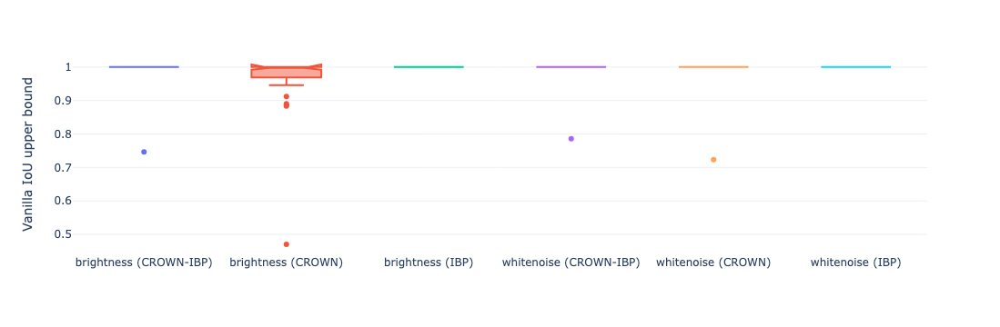

In [57]:
list_bri_white = []
for pert in ["brightness", "whitenoise"]:
    print("epsilon", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==0.0004) & (combined_df["perturbation"]==pert)]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Vanilla_upper":f'{pert} (CROWN-IBP)'}), [f'{pert} (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Vanilla_upper":f'{pert} (CROWN)'}), [f'{pert} (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Vanilla_upper":f'{pert} (IBP)'}), [f'{pert} (IBP)'], return_V=True)
    list_bri_white.append(df_CROWN_IBP_iou)
    list_bri_white.append(df_CROWN_iou)
    list_bri_white.append(df_IBP_iou)
ious_bri_white = pd.concat(list_bri_white)
create_box_plot(ious_bri_white, columns=[""], return_V=False, without_melt=True, y_axes='Vanilla IoU upper bound')

epsilon 0.01
epsilon 0.01


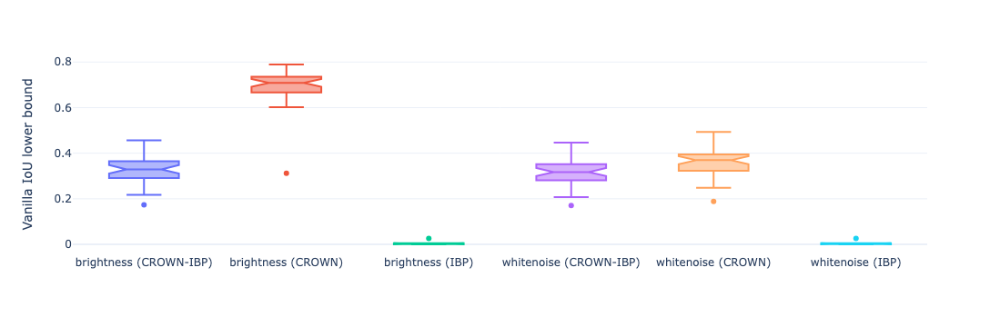

In [58]:
list_bri_white = []
for pert in ["brightness", "whitenoise"]:
    print("epsilon", eps)
    truth_ious = combined_df[(combined_df["fake_iou"]==False) & (combined_df["eps"]==0.0004) & (combined_df["perturbation"]==pert)]
    df_CROWN_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP+backward (CROWN-IBP)'].rename(columns={
        "Vanilla_lower":f'{pert} (CROWN-IBP)'}), [f'{pert} (CROWN-IBP)'], return_V=True)
    df_CROWN_iou = create_box_plot(truth_ious[truth_ious["method"] == 'backward (CROWN)'].rename(columns={
        "Vanilla_lower":f'{pert} (CROWN)'}), [f'{pert} (CROWN)'], return_V=True)
    df_IBP_iou = create_box_plot(truth_ious[truth_ious["method"] == 'IBP'].rename(columns={
        "Vanilla_lower":f'{pert} (IBP)'}), [f'{pert} (IBP)'], return_V=True)
    list_bri_white.append(df_CROWN_IBP_iou)
    list_bri_white.append(df_CROWN_iou)
    list_bri_white.append(df_IBP_iou)
ious_bri_white = pd.concat(list_bri_white)
create_box_plot(ious_bri_white, columns=[""], return_V=False, without_melt=True, y_axes='Vanilla IoU lower bound')

# Best or worst images 

In [59]:
df_groupybimage = combined_df.groupby("image_id")[["IoU_vanilla_delta",	"IoU_extension_delta"]].agg("mean")
df_groupybimage["enveloppe_diff"] = df_groupybimage["IoU_vanilla_delta"]-df_groupybimage["IoU_extension_delta"]

In [60]:
df_groupybimage

,IoU_vanilla_delta,IoU_extension_delta,enveloppe_diff
image_id,,,
0,0.596252,0.521435,0.074817
1,0.622215,0.571222,0.050992
2,0.631943,0.572988,0.058955
3,0.633699,0.563829,0.069871
5,0.617210,0.537925,0.079286
7,0.626280,0.564992,0.061288
8,0.638531,0.583242,0.055289
9,0.597959,0.502841,0.095118
10,0.600321,0.522431,0.077890


In [28]:
list_perturb=list(combined_df.groupby("image_id")[["IoU_vanilla_delta"]].agg("count")[combined_df.groupby("image_id")[["IoU_vanilla_delta"]].agg("count")<8].dropna().index)
df_groupybimage = df_groupybimage.drop(index=list_perturb)

In [29]:
df_groupybimage.sort_values(by="enveloppe_diff").head(2)

,IoU_vanilla_delta,IoU_extension_delta,enveloppe_diff
image_id,,,
297,0.607336,0.583897,0.023439
296,0.596471,0.573030,0.023441


In [30]:
display_im(73)

NameError: name 'images' is not defined

In [52]:
combined_df[combined_df["image_id"] == 80 ]

,Unnamed: 0,method,image_id,eps,eps_contrast,fake_iou,perturbation,bounds_clip,elapsed_time_perturbation,elapsed_time_eps_computed_ious,...,lb_box0,ub_box,IoU_vanilla_delta,IoU_extension_delta,Vanilla_upper,Vanilla_lower,Extension_upper,Extension_lower,bad_images,optimal_up_or_down
839,47,IBP+backward (CROWN-IBP),80,0.00008,0.04,True,contrast,"[[0, 0, 0, 0], [256, 256, 256, 256]]",0.663530,0.027639,...,0.00000,"[256, 256, 256, 256]",1.000000,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False,False
819,27,IBP,80,0.00018,0.09,True,whitenoise,"[[80.3965, 106.18383, 89.78611, 114.1057], [12...",0.464608,0.001952,...,80.39650,"[123.39519, 139.75868, 133.73665, 150.04189]",1.000000,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False,False
820,28,IBP,80,0.00018,0.09,True,brightness,"[[80.3965, 106.18383, 89.78611, 114.1057], [12...",0.464608,0.003245,...,80.39650,"[123.39519, 139.75868, 133.73665, 150.04189]",1.000000,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False,False
821,29,IBP,80,0.00018,0.09,True,contrast,"[[0, 0, 0, 0], [256, 256, 256, 256]]",0.464608,0.004539,...,0.00000,"[256, 256, 256, 256]",1.000000,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False,False
822,30,IBP,80,0.00020,0.10,True,whitenoise,"[[78.00946, 104.36722, 87.40923, 112.139595], ...",0.478482,0.001792,...,78.00946,"[125.73253, 141.6145, 136.18974, 151.98634]",1.000000,1.000000e+00,1.000000,0.000000,1.000000,0.000000,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
863,71,backward (CROWN),80,0.00002,0.01,False,contrast,"[[101.5092, 122.35801, 110.926926, 131.33163],...",3.860584,0.039317,...,101.50920,"[102.592224, 123.622574, 112.23902, 132.75107]",0.575555,3.001710e-01,0.954549,0.378994,0.754005,0.453834,False,False
864,72,backward (CROWN),80,0.00004,0.02,False,whitenoise,"[[101.88559, 122.89795, 111.41333, 131.94638],...",4.619733,0.014495,...,101.88559,"[102.22171, 123.043884, 111.76126, 132.09903]",0.104145,5.571228e-02,0.640420,0.536276,0.613903,0.558191,False,False
866,74,backward (CROWN),80,0.00004,0.02,False,contrast,"[[100.77227, 121.67381, 110.0554, 130.5662], [...",4.619733,0.041687,...,100.77227,"[103.36574, 124.39987, 113.12728, 133.6079]",0.794217,6.083914e-01,1.000000,0.205783,0.936076,0.327684,False,False
792,0,IBP,80,0.00000,0.00,False,whitenoise,"[[102.05362, 122.9709, 111.58729, 132.02263], ...",0.511562,0.013879,...,102.05362,"[102.05362, 122.9709, 111.58729, 132.02263]",0.000000,-1.745605e-08,0.585371,0.585371,0.585371,0.585371,False,False


In [53]:
def optimal_up_or_down(x):
    if (x.Vanilla_lower <= 0.5) & (x.Extension_lower >= 0.5):
        return(True)
    else:
        return(False)

combined_df["optimal_up_or_down"] = combined_df.apply(lambda x: optimal_up_or_down(x), axis=1)


/var/folders/85/rkcmsdf568q3lwnpbg8swry40000gn/T/ipykernel_14935/361799006.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [54]:
np.unique(combined_df["method"])

array(['IBP', 'IBP+backward (CROWN-IBP)', 'backward (CROWN)'],
      dtype=object)

In [55]:
nb_optimal_up_or_down = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="brightness") & (combined_df["optimal_up_or_down"] == True) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="brightness")  & (combined_df["fake_iou"] == False)].shape[0]
nb_optimal_up_or_down_percent_bri_CROWN = nb_optimal_up_or_down/nb_total*100
print(nb_optimal_up_or_down/nb_total*100)

0.0


In [56]:
nb_optimal_up_or_down = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="whitenoise") & (combined_df["optimal_up_or_down"] == True) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="whitenoise")  & (combined_df["fake_iou"] == False)].shape[0]
nb_optimal_up_or_down_percent_white_CROWN = nb_optimal_up_or_down/nb_total*100
print(nb_optimal_up_or_down/nb_total*100)

9.554730983302411


In [57]:
name1 = str(round(nb_optimal_up_or_down_percent_white_CROWN,2))+"%"

In [58]:
nb_optimal_up_or_down_percent_bri_CROWN

0.0

In [59]:
name2 = str(round(nb_optimal_up_or_down_percent_bri_CROWN,2))+"%"

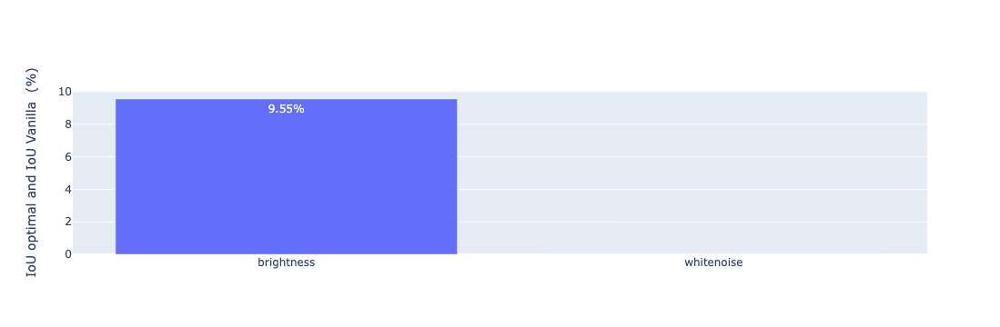

In [60]:
import plotly.graph_objects as go
perturbations=['brightness', 'whitenoise']

fig = go.Figure([go.Bar(x=perturbations, y=[nb_optimal_up_or_down_percent_white_CROWN ,nb_optimal_up_or_down_percent_bri_CROWN], text=[name1, name2])])
fig.update_yaxes(title_text="IoU optimal and IoU Vanilla  (%)")
fig.show()

In [99]:
combined_df.columns

Index(['Unnamed: 0', 'method', 'image_id', 'gt_logit', 'eps', 'eps_contrast',
       'fake_iou', 'perturbation', 'bounds_clip', 'elapsed_time_perturbation',
       'elapsed_time_eps_computed_ious', 'IoU_vanilla', 'tmps_vanilla',
       'IoU_extension', 'tmps_extension', 'lb_box', 'lb_box0', 'ub_box',
       'IoU_vanilla_delta', 'IoU_extension_delta', 'Vanilla_upper',
       'Vanilla_lower', 'Extension_upper', 'Extension_lower', 'bad_images',
       'optimal_up_or_down'],
      dtype='object')

In [100]:
data1 = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="brightness") & (combined_df["Extension_lower"] >= 0.5) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="brightness") & (combined_df["fake_iou"] == False)].shape[0]
optimal_sup_bri_CROWN = data1/nb_total*100
print(optimal_sup_bri_CROWN)

65.0


In [101]:
data2 = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="brightness") & (combined_df["Vanilla_lower"] >= 0.5) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="brightness") & (combined_df["fake_iou"] == False)].shape[0]
vanilla_sup_bri_CROWN = data2/nb_total*100
print(vanilla_sup_bri_CROWN)

42.72727272727273


In [102]:
data3 = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="whitenoise") & (combined_df["Extension_lower"] >= 0.5) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="whitenoise") & (combined_df["fake_iou"] == False)].shape[0]
optimal_sup_white_CROWN = data3/nb_total*100
print(optimal_sup_white_CROWN)

65.0


In [104]:
data2 = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="whitenoise") & (combined_df["Vanilla_lower"] >= 0.5) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="whitenoise") & (combined_df["fake_iou"] == False)].shape[0]
vanilla_sup_white_CROWN = data2/nb_total*100
print(vanilla_sup_white_CROWN)

26.82926829268293


In [110]:
data4 = combined_df[(combined_df["perturbation"]=="contrast") & (combined_df["Extension_lower"] >= 0.5) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[ (combined_df["perturbation"]=="contrast") & (combined_df["fake_iou"] == False)].shape[0]
optimal_sup_contrast_CROWN = data4/nb_total*100
print(optimal_sup_contrast_CROWN)

78.7201233616037


In [111]:
data4 = combined_df[(combined_df["perturbation"]=="contrast") & (combined_df["Vanilla_lower"] >= 0.5) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[ (combined_df["perturbation"]=="contrast") & (combined_df["fake_iou"] == False)].shape[0]
vanilla_sup_contrast_CROWN = data4/nb_total*100
print(vanilla_sup_contrast_CROWN)

72.78334618350038


In [ ]:
import plotly.graph_objects as go
perturbations=['contrast', 'orangutans', 'monkeys']

fig = go.Figure(data=[
    go.Bar(name='Vanilla IoU', x=animals, y=[20, 14, 23]),
    go.Bar(name='Optimal IoU', x=animals, y=[12, 18, 29])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

In [ ]:
import plotly.graph_objects as go
perturbations=['brightness', 'whitenoise', 'monkeys']

fig = go.Figure(data=[
    go.Bar(name='Vanilla IoU extension', x=perturbations, y=[20, 14, 23], text=[]),
    go.Bar(name='Optimal IoU', x= perturbations, y=[12, 18, 29], text=[])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

In [80]:
combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="contrast")].describe()[["Extension_lower", "Vanilla_lower"]]

,Extension_lower,Vanilla_lower
count,440.000000,440.000000
mean,0.863776,0.859652
std,0.092871,0.093349
min,0.391524,0.382598
25%,0.845528,0.840110
50%,0.885752,0.879572
75%,0.914345,0.912711
max,0.965224,0.965224


In [81]:
combined_df[(combined_df["perturbation"]=="contrast")].describe()[["Extension_lower", "Vanilla_lower"]]

,Extension_lower,Vanilla_lower
count,1320.000000,1320.000000
mean,0.698064,0.642062
std,0.280010,0.325718
min,0.000000,0.000000
25%,0.568591,0.378128
50%,0.826016,0.799819
75%,0.892728,0.884593
max,0.965224,0.965224


In [74]:
nb_optimal_up_or_down = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="contrast") & (combined_df["optimal_up_or_down"] == True) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="contrast")  & (combined_df["fake_iou"] == False)].shape[0]
print(nb_optimal_up_or_down/nb_total*100)

0.0


In [82]:
nb_optimal_up_or_down = combined_df[ (combined_df["perturbation"]=="contrast") & (combined_df["optimal_up_or_down"] == True) & (combined_df["fake_iou"] == False)].shape[0]
nb_total = combined_df[(combined_df["perturbation"]=="contrast")  & (combined_df["fake_iou"] == False)].shape[0]
print(nb_optimal_up_or_down/nb_total*100)

5.936777178103315


In [76]:
combined_df[(combined_df["method"]=='backward (CROWN)') & (combined_df["perturbation"]=="contrast")]

,Unnamed: 0,method,image_id,gt_logit,eps,eps_contrast,fake_iou,perturbation,bounds_clip,elapsed_time_perturbation,...,lb_box0,ub_box,IoU_vanilla_delta,IoU_extension_delta,Vanilla_upper,Vanilla_lower,Extension_upper,Extension_lower,bad_images,optimal_up_or_down
1781,98,backward (CROWN),0,0,0.0020,0.010,False,contrast,"[[12.580206, 21.177135, 40.756363, 49.687252],...",44.612956,...,12.580206,"[12.631627, 21.240309, 40.81744, 49.822018]",0.020956,9.414473e-03,0.890408,0.869453,0.884564,0.875150,False,False
1754,71,backward (CROWN),0,0,0.0002,0.001,False,contrast,"[[12.59687, 21.21284, 40.789734, 49.75555], [1...",5.246951,...,12.596870,"[12.600452, 21.217833, 40.79477, 49.76763]",0.001789,7.797752e-04,0.881100,0.879311,0.880594,0.879815,False,False
1751,68,backward (CROWN),0,0,0.0000,0.000,False,contrast,"[[12.598661, 21.215336, 40.79225, 49.76159], [...",1.463169,...,12.598661,"[12.598661, 21.215336, 40.79225, 49.76159]",0.000000,8.367920e-10,0.880204,0.880204,0.880204,0.880204,False,False
1757,74,backward (CROWN),0,0,0.0004,0.002,False,contrast,"[[12.595079, 21.21034, 40.78709, 49.74951], [1...",12.699298,...,12.595079,"[12.602803, 21.220327, 40.797283, 49.773666]",0.003605,1.579983e-03,0.882016,0.878411,0.881001,0.879421,False,False
1778,95,backward (CROWN),0,0,0.0018,0.009,False,contrast,"[[12.582052, 21.181417, 40.760273, 49.69531], ...",38.408168,...,12.582052,"[12.626978, 21.23781, 40.814922, 49.815975]",0.018722,8.390220e-03,0.889311,0.870589,0.884087,0.875696,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1973,92,backward (CROWN),43,0,0.0016,0.008,False,contrast,"[[51.930763, 39.525093, 80.49225, 67.817764], ...",41.636574,...,51.930763,"[52.13888, 39.582966, 80.768394, 67.93988]",0.043398,2.021849e-02,0.893934,0.850536,0.882028,0.861809,False,False
1979,98,backward (CROWN),43,0,0.0020,0.010,False,contrast,"[[51.90052, 39.51446, 80.451385, 67.7965], [52...",50.885787,...,51.900520,"[52.165176, 39.590363, 80.80337, 67.95563]",0.055653,2.590899e-02,0.900023,0.844370,0.884632,0.858723,False,False
1955,74,backward (CROWN),43,0,0.0004,0.002,False,contrast,"[[52.01204, 39.549053, 80.60037, 67.86668], [5...",12.377784,...,52.012040,"[52.062805, 39.562645, 80.667595, 67.896]",0.010520,4.900460e-03,0.877461,0.866941,0.874633,0.869732,False,False
1949,68,backward (CROWN),43,0,0.0000,0.000,False,contrast,"[[52.03745, 39.55587, 80.634, 67.88138], [52.0...",1.433895,...,52.037450,"[52.03745, 39.55587, 80.634, 67.88138]",0.000000,9.581757e-09,0.872182,0.872182,0.872182,0.872182,False,False


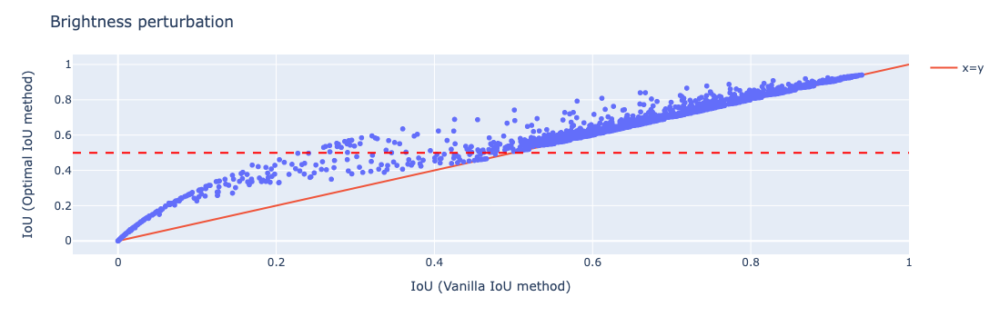

In [61]:

kk = combined_df[combined_df["perturbation"]=="brightness"].rename(columns={
    "Vanilla_lower":"IoU (Vanilla IoU method)",
    "Extension_lower":"IoU (Optimal IoU method)"})
fig = px.scatter(kk, x="IoU (Vanilla IoU method)", y="IoU (Optimal IoU method)")
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
#fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y'))
fig.update_layout(title='Brightness perturbation' )
fig.show()


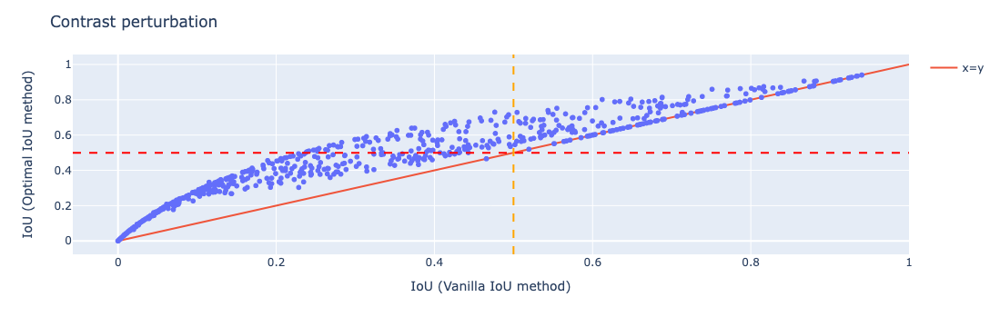

In [62]:
kk = combined_df[combined_df["perturbation"]=="contrast"].rename(columns={
    "Vanilla_lower":"IoU (Vanilla IoU method)",
    "Extension_lower":"IoU (Optimal IoU method)"})
fig = px.scatter(kk, x="IoU (Vanilla IoU method)", y="IoU (Optimal IoU method)")
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y'))
fig.update_layout(title='Contrast perturbation' )
fig.show()

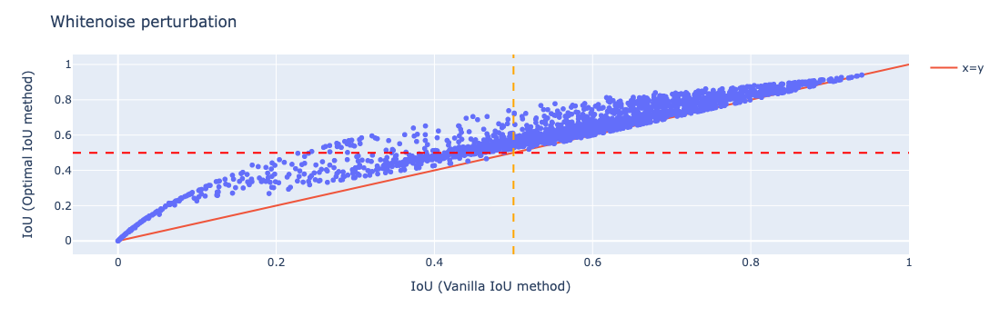

In [65]:
kk = combined_df[combined_df["perturbation"]=="whitenoise"].rename(columns={
    "Vanilla_lower":"IoU (Vanilla IoU method)",
    "Extension_lower":"IoU (Optimal IoU method)"})

fig = px.scatter(kk, x="IoU (Vanilla IoU method)", y="IoU (Optimal IoU method)")
fig.update_layout(title='Whitenoise perturbation' )
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y'))
fig.show()

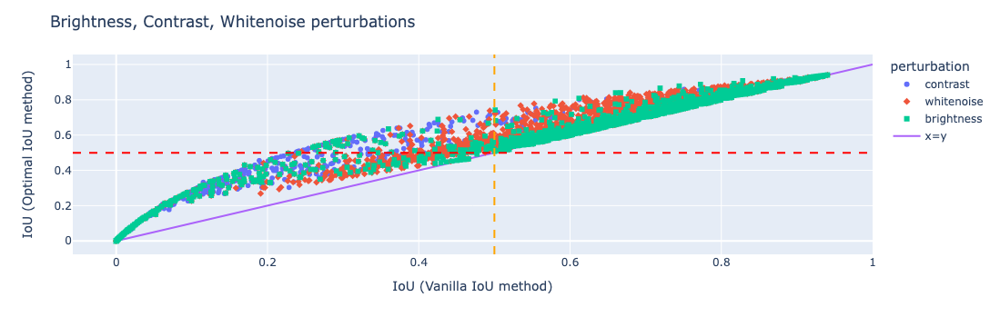

In [66]:
kk = combined_df.rename(columns={
    "Vanilla_lower":"IoU (Vanilla IoU method)",
    "Extension_lower":"IoU (Optimal IoU method)"})
fig = px.scatter(kk, x="IoU (Vanilla IoU method)", y="IoU (Optimal IoU method)", symbol="perturbation", color="perturbation")
fig.add_hline(y=0.5, line_dash="dash", line_color="red")
fig.add_vline(x=0.5, line_dash="dash", line_color="orange")
fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines', name='x=y'))
fig.update_layout(title='Brightness, Contrast, Whitenoise perturbations' )
fig.show()


In [241]:
combined_df

,Unnamed: 0,image_id,gt_logit,eps,fake_iou,perturbation,bounds_clip,elapsed_time_perturbation,elapsed_time_eps_computed_ious,IoU_vanilla,tmps_vanilla,IoU_extension,tmps_extension,IoU_vanilla_delta,IoU_extension_delta,Vanilla_upper,Vanilla_lower,Extension_upper,Extension_lower,bad_images
12727,1,0,0,0.000000,False,brightness,"[[29.806683, 14.438718, 57.42273, 42.527035], ...",0.384682,0.020086,"[0.9401939728397936, 0.9401939728397936]",0.000056,"[0.9401939511299133, 0.94019395]",0.007692,0.000000,-1.129913e-09,0.940194,0.940194,0.940194,0.940194,False
12746,20,0,0,0.000336,False,contrast,"[[28.837557, 13.85047, 56.13203, 41.693127], [...",0.289327,0.029495,"[0.42502288450864567, 1]",0.000060,"[0.5856223106384277, 1.0]",0.007546,0.574977,4.143777e-01,1.000000,0.425023,1.000000,0.585622,False
12747,21,0,0,0.000392,False,whitenoise,"[[28.473392, 13.648253, 55.61319, 41.343662], ...",0.310956,0.009948,"[0.351605456196351, 1]",0.000061,"[0.5283302068710327, 1.0]",0.007835,0.648395,4.716698e-01,1.000000,0.351605,1.000000,0.528330,False
12748,22,0,0,0.000392,False,brightness,"[[28.600836, 13.718106, 55.828335, 41.49885], ...",0.310956,0.019296,"[0.3626996778613171, 1]",0.000056,"[0.5301610827445984, 1.0]",0.007562,0.637300,4.698389e-01,1.000000,0.362700,1.000000,0.530161,False
12749,23,0,0,0.000392,False,contrast,"[[28.600836, 13.718106, 55.828335, 41.49885], ...",0.310956,0.028318,"[0.3626996778613171, 1]",0.000056,"[0.5301610827445984, 1.0]",0.007309,0.637300,4.698389e-01,1.000000,0.362700,1.000000,0.530161,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22167,48,99,0,0.000896,False,whitenoise,"[[43.849506, 20.848616, 71.02205, 48.34973], [...",0.295270,0.009640,"[0.02162539609080505, 1]",0.000071,"[0.08585081994533539, 1.0]",0.007598,0.978375,9.141492e-01,1.000000,0.021625,1.000000,0.085851,False
22168,49,99,0,0.000896,False,brightness,"[[44.285725, 21.103542, 71.656166, 48.790276],...",0.295270,0.018465,"[0.026022758074953477, 1]",0.000065,"[0.10161251574754715, 1.0]",0.007106,0.973977,8.983875e-01,1.000000,0.026023,1.000000,0.101613,False
22169,50,99,0,0.000896,False,contrast,"[[44.285725, 21.103542, 71.656166, 48.790276],...",0.295270,0.026166,"[0.026022758074953477, 1]",0.000052,"[0.10161251574754715, 1.0]",0.006206,0.973977,8.983875e-01,1.000000,0.026023,1.000000,0.101613,False
22121,2,99,0,0.000000,False,contrast,"[[49.236916, 25.056616, 77.97139, 53.980453], ...",0.305708,0.028473,"[0.8179779870776601, 0.8179779870776601]",0.000059,"[0.8179779648780823, 0.81797796]",0.007420,0.000000,-4.878082e-09,0.817978,0.817978,0.817978,0.817978,False


In [35]:
avg_precision = combined_df.groupby(["eps", "perturbation"])[["IoU_vanilla_delta",	"IoU_extension_delta"]].agg("mean")
avg_precision.reset_index().head(5)

,eps,perturbation,IoU_vanilla_delta,IoU_extension_delta
0,0.00000,brightness,0.000000,1.180063e-10
1,0.00000,contrast,0.000000,1.180063e-10
2,0.00000,whitenoise,0.000000,1.180063e-10
3,0.00003,brightness,0.091298,4.846620e-02
4,0.00003,contrast,0.000126,6.841084e-05


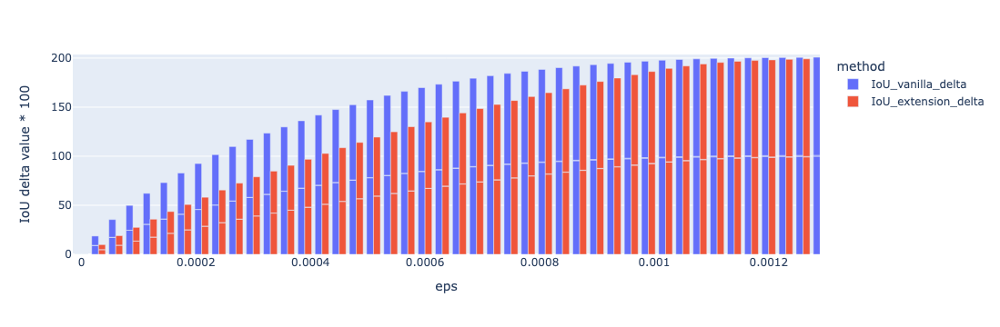

In [37]:
avg_precision = combined_df.groupby(["eps", "perturbation"])[["IoU_vanilla_delta",	"IoU_extension_delta"]].agg("mean")
avg_precision.reset_index().head(5)
avg_precision = combined_df.groupby(["eps", "perturbation"])[["IoU_vanilla_delta",	"IoU_extension_delta"]].agg("mean")
df_melted = avg_precision.reset_index().melt(id_vars='eps', value_vars=["IoU_vanilla_delta",	"IoU_extension_delta"], 
                                             var_name='method', 
                                             value_name='IoU delta value')
df_melted["IoU delta value * 100"] = df_melted["IoU delta value"].apply(lambda x: x*100)
px.bar(df_melted, x="eps", y="IoU delta value * 100", color="method", barmode="group")

In [ ]:
[["image_id", "eps", "Extension_upper", "Extension_lower" ]].sort_values(by="eps").head(6)

In [94]:
im1 = pd.read_csv("/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/many_methods/0_iou_calculations.csv", converters={ 'IoU_vanilla':pd.eval,'IoU_extension':pd.eval,'IoU_extension_greedy':pd.eval})

In [96]:
im1["IoU_vanilla_delta"] = im1.IoU_vanilla.apply(lambda x: x[1]-x[0])
im1["IoU_extension_delta"] = im1.IoU_extension.apply(lambda x: x[1]-x[0])

im1["Vanilla_upper"] = im1.IoU_vanilla.apply(lambda x: x[1])
im1["Vanilla_lower"] = im1.IoU_vanilla.apply(lambda x: x[0])
im1["Extension_upper"] =im1.IoU_extension.apply(lambda x: x[1])
im1["Extension_lower"] = im1.IoU_extension.apply(lambda x: x[0])

,method,image_id,eps,Extension_upper,Extension_lower
12,IBP,0,0.00008,0.966314,0.706445
315,IBP+backward (CROWN-IBP),0,0.00008,0.946414,0.845743
618,backward (CROWN),0,0.00008,0.946414,0.845743


,method,image_id,eps,Extension_upper,Extension_lower
13,IBP,0,0.00008,0.966314,0.706445
316,IBP+backward (CROWN-IBP),0,0.00008,0.944290,0.847994
619,backward (CROWN),0,0.00008,0.944290,0.847994


## Trajectoire 

In [258]:
from contextlib import closing
import pickle as pkl
import ast

In [262]:
images_trajec = pd.read_csv("/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/trajec/contr_images.csv",
                           )
image1_trajec = torch.tensor(list(images_trajec.loc[0][1:])).view(-1,3,256,256)

In [263]:
def convert_string_to_list(string): 
    list = string.split("[")[1].split("]")[0].split(" ")
    try: 
        return(ast.literal_eval(string))
    except:
        new_list = []
        for i in list: 
            if i!="":
                new_list.append(float(i))
        return(new_list)

In [264]:
string = '[154.77124 102.09064 180.18301 120.9426 ]'
convert_string_to_list(string)

[154.77124, 102.09064, 180.18301, 120.9426]

In [265]:
trajec1 = pd.read_csv("/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/trajec/contr_1_iou_calculations.csv", 
                     converters={"ub_box":convert_string_to_list, 
                                 "lb_box":convert_string_to_list,
                                 "gt":convert_string_to_list})

In [266]:
ub_box = list(trajec1["ub_box"])
lb_box = list(trajec1["lb_box"])
gt_box = list(trajec1["gt"])

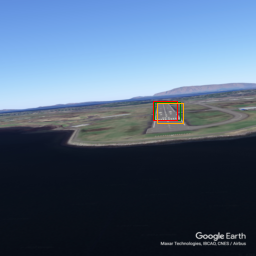

In [267]:
from PIL import Image, ImageDraw

def show_im_origin(X, eps, gt_box, pred1 = [0,0,0,0], pred2 = [0,0,0,0], name=""):
    if X.max() >= 1:
        raise ValueError("Image should be in 0 and 1.")
    ymin, xmin, ymax, xmax  = gt_box
    pred1_ymin, pred1_xmin, pred1_ymax, pred1_xmax = pred1
    pred2_ymin, pred2_xmin, pred2_ymax, pred2_xmax = pred2
    X_t = X.cpu()
    X_t = X_t.mul(255)
    X_t = X_t + eps
    X_t = X_t.byte()
    X_t = X_t.permute(1,2,0)
    X_t = X_t.numpy()
    
    pil_image = Image.fromarray(X_t, mode="RGB")
    draw = ImageDraw.Draw(pil_image)
    draw.rectangle([ymin, xmin, ymax, xmax], outline="green")
    draw.rectangle([pred1_ymin, pred1_xmin, pred1_ymax, pred1_xmax], outline="red")
    draw.rectangle([pred2_ymin, pred2_xmin, pred2_ymax, pred2_xmax], outline="orange")
    if name != "": 
        pil_image.save(f"results/LARDExpe/imagestrajec/{name}.png")
    return(pil_image)

show_im_origin(image1_trajec[0, :,:,:],eps_list[3], gt_box=gt_box[3], pred1 = lb_box[3], pred2 =ub_box[3], name=f"{3}_trajec")

In [268]:
eps_list[3]

0.006

In [269]:
image1_trajec[0, :,:,:]*255

tensor([[[ 96.,  96.,  96.,  ..., 113., 113., 113.],
         [ 97.,  97.,  97.,  ..., 113., 113., 113.],
         [ 97.,  97.,  97.,  ..., 114., 113., 113.],
         ...,
         [  8.,   8.,   9.,  ...,  10.,  10.,   9.],
         [  8.,   8.,   8.,  ...,  11.,  13.,   8.],
         [  8.,   8.,   8.,  ...,  13.,  10.,   9.]],

        [[143., 143., 143.,  ..., 164., 164., 164.],
         [144., 144., 144.,  ..., 165., 165., 165.],
         [144., 144., 144.,  ..., 166., 166., 166.],
         ...,
         [ 13.,  12.,  13.,  ...,  14.,  14.,  13.],
         [ 12.,  12.,  13.,  ...,  16.,  18.,  13.],
         [ 12.,  12.,  12.,  ...,  18.,  15.,  13.]],

        [[221., 221., 221.,  ..., 234., 234., 234.],
         [222., 222., 222.,  ..., 233., 234., 234.],
         [222., 222., 222.,  ..., 234., 234., 234.],
         ...,
         [ 21.,  21.,  22.,  ...,  23.,  23.,  22.],
         [ 21.,  21.,  22.,  ...,  24.,  25.,  22.],
         [ 21.,  21.,  21.,  ...,  25.,  23.,  22.]]]

In [271]:
list_image_trajec = []
for i in range(len(gt_box)):
    list_image_trajec.append(show_im_origin(image1_trajec[0, :,:,:],eps_list[i], name=f"{i}_trajec", gt_box=gt_box[i], pred1 = lb_box[i], pred2 =ub_box[i]))

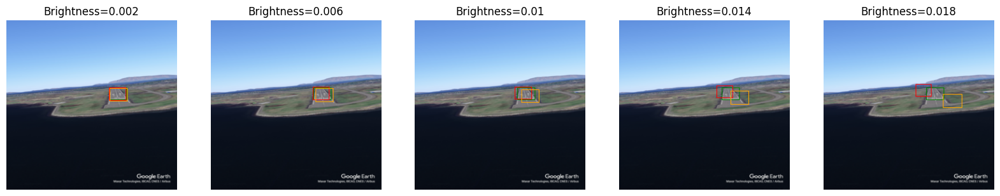

In [272]:
import matplotlib.pyplot
n = len(list_image_trajec)
fix, axes = plt.subplots(1, 5, figsize=(20,5))
subplot_index = 0
for i, img in enumerate(list_image_trajec): 
    if i%2 == 1:
        axes[subplot_index].imshow(img)
        axes[subplot_index].axis('off')
        axes[subplot_index].set_title(f"Brightness={round(eps_list[i],3)}")
        subplot_index += 1
plt.show()

## Trajectoire plus fort

In [273]:
images_trajec = pd.read_csv("/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/trajec/new/contr_images.csv"
                           )
image1_trajec = torch.tensor(list(images_trajec.loc[0][1:])).view(-1,3,256,256)

In [274]:
trajec1 = pd.read_csv("/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/trajec/new/contr_1_iou_calculations.csv", 
                     converters={"ub_box":convert_string_to_list, 
                                 "lb_box":convert_string_to_list,
                                 "gt":convert_string_to_list})

In [275]:
ub_box = list(trajec1["ub_box"])
lb_box = list(trajec1["lb_box"])
gt_box = list(trajec1["gt"])

In [277]:
list_image_trajec = []
for i in range(len(gt_box)):
    list_image_trajec.append(show_im_origin(image1_trajec[0, :,:,:],list(trajec1["eps"])[i], 
                                            name=f"", 
                                            gt_box=gt_box[i], 
                                            pred1 = lb_box[i], 
                                            pred2 =ub_box[i]))

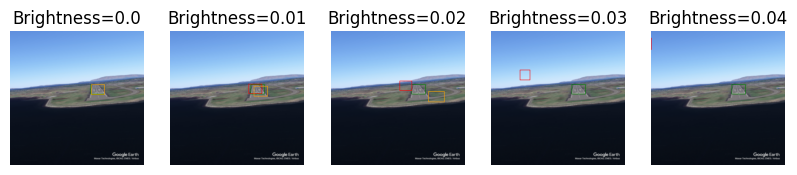

In [280]:
import matplotlib.pyplot
n = len(list_image_trajec)
fix, axes = plt.subplots(1, 5, figsize=(10,5))
subplot_index = 0
for i, img in enumerate(list_image_trajec[0:5]): 
    axes[subplot_index].imshow(img)
    axes[subplot_index].axis('off')
    epsi=round(list(trajec1["eps"])[i],3)
    axes[subplot_index].set_title(f"Brightness={epsi}")
    subplot_index += 1
plt.show()

In [224]:
list(trajec1["eps"])

[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]

0.04

In [230]:
image1_trajec[0, :,:,:]*255+list(trajec1["eps"])[i]

tensor([[[ 96.0400,  96.0400,  96.0400,  ..., 113.0400, 113.0400, 113.0400],
         [ 97.0400,  97.0400,  97.0400,  ..., 113.0400, 113.0400, 113.0400],
         [ 97.0400,  97.0400,  97.0400,  ..., 114.0400, 113.0400, 113.0400],
         ...,
         [  8.0400,   8.0400,   9.0400,  ...,  10.0400,  10.0400,   9.0400],
         [  8.0400,   8.0400,   8.0400,  ...,  11.0400,  13.0400,   8.0400],
         [  8.0400,   8.0400,   8.0400,  ...,  13.0400,  10.0400,   9.0400]],

        [[143.0400, 143.0400, 143.0400,  ..., 164.0400, 164.0400, 164.0400],
         [144.0400, 144.0400, 144.0400,  ..., 165.0400, 165.0400, 165.0400],
         [144.0400, 144.0400, 144.0400,  ..., 166.0400, 166.0400, 166.0400],
         ...,
         [ 13.0400,  12.0400,  13.0400,  ...,  14.0400,  14.0400,  13.0400],
         [ 12.0400,  12.0400,  13.0400,  ...,  16.0400,  18.0400,  13.0400],
         [ 12.0400,  12.0400,  12.0400,  ...,  18.0400,  15.0400,  13.0400]],

        [[221.0400, 221.0400, 221.0400,  ...

In [281]:
np.linspace(0, 0.02,11)

array([0.   , 0.002, 0.004, 0.006, 0.008, 0.01 , 0.012, 0.014, 0.016,
       0.018, 0.02 ])

## Trajectoire

In [361]:
images_trajec_many = pd.read_csv("/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/trajec/manyFAR/infos/contr_images.csv",
                           )


In [362]:
images_trajec_many_list = []

for index in images_trajec_many.index: 
    images_trajec_many_list.append(torch.tensor(list(images_trajec_many.loc[index][1:])).view(3,256,256))

In [363]:
folder_path = "/Users/ncohmpli/Documents/Professionnel/Technical/Verification/Lirpa for IoU/manip/pipeline/lirpa_iou_pipeline/results/trajec/manyFAR"
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]
dfs = []
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    df = pd.read_csv(file_path, converters={"ub_box":convert_string_to_list, 
                                 "lb_box":convert_string_to_list,
                                 "gt":convert_string_to_list, "bounds_clip":pd.eval,  'IoU_vanilla':pd.eval,'IoU_extension':pd.eval,'IoU_extension_greedy':pd.eval})
    dfs.append(df)
    trajec_many = pd.concat(dfs, ignore_index=True)


In [364]:
np.unique(list(trajec_many["eps"]))

array([0.   , 0.002, 0.004, 0.006, 0.008, 0.01 , 0.012, 0.014, 0.016,
       0.018, 0.02 ])

In [367]:
trajec_many

,Unnamed: 0,method,image_id,eps,fake_iou,perturbation,bounds_clip,ub_box,lb_box,gt,elapsed_time_perturbation,elapsed_time_eps_computed_ious,IoU_vanilla,tmps_vanilla,IoU_extension,tmps_extension
0,0,backward (CROWN),67,0.000,False,brightness,"[[143.83246, 134.23648, 154.42943, 146.1972], ...","[143.83246, 134.23648, 154.42943, 146.1972]","[143.83246, 134.23648, 154.42943, 146.1972]","[142.7451, 132.35045, 153.20262, 144.33836]",0.577674,0.010370,"[0.6011641181241927, 0.6011641181241927]",0.000074,"[0.6011641025543213, 0.6011641]",0.008456
1,1,backward (CROWN),67,0.002,False,brightness,"[[143.4225, 134.00476, 154.06035, 145.9553], [...","[144.24431, 134.47421, 154.79701, 146.44447]","[143.4225, 134.00476, 154.06035, 145.9553]","[142.7451, 132.35045, 153.20262, 144.33836]",2.856661,0.009599,"[0.4950669103604628, 0.7376987794091948]",0.000063,"[0.5410736203193665, 0.6674053]",0.007751
2,2,backward (CROWN),67,0.004,False,brightness,"[[142.94566, 133.73833, 153.62117, 145.67368],...","[144.7266, 134.7477, 155.23413, 146.72757]","[142.94566, 133.73833, 153.62117, 145.67368]","[142.7451, 132.35045, 153.20262, 144.33836]",4.289193,0.011543,"[0.39908871704532417, 0.9552144714765636]",0.000078,"[0.47831588983535767, 0.7547371]",0.009358
3,3,backward (CROWN),67,0.006,False,brightness,"[[142.39937, 133.4278, 153.11217, 145.34029], ...","[145.2885, 135.05368, 155.75247, 147.04509]","[142.39937, 133.4278, 153.11217, 145.34029]","[142.7451, 132.35045, 153.20262, 144.33836]",5.291873,0.009942,"[0.3096918092405965, 1]",0.000063,"[0.41429582238197327, 0.839931]",0.008087
4,4,backward (CROWN),67,0.008,False,brightness,"[[141.78381, 133.09363, 152.53148, 144.98233],...","[145.93301, 135.39575, 156.3558, 147.39893]","[141.78381, 133.09363, 152.53148, 144.98233]","[142.7451, 132.35045, 153.20262, 144.33836]",5.938053,0.009832,"[0.21471876185789943, 1]",0.000066,"[0.35052773356437683, 0.8901869]",0.007902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,6,backward (CROWN),56,0.012,False,brightness,"[[87.973206, 120.37427, 120.07815, 129.49506],...","[93.08765, 125.20462, 125.8415, 134.46577]","[87.973206, 120.37427, 120.07815, 129.49506]","[89.62092, 121.23263, 121.93464, 130.32024]",6.993230,0.011690,"[0.16276194362742027, 1]",0.000076,"[0.3283548057079315, 1.0]",0.009336
106,7,backward (CROWN),56,0.014,False,brightness,"[[87.31696, 119.87614, 119.34886, 128.98367], ...","[93.809944, 125.75245, 126.61187, 135.0263]","[87.31696, 119.87614, 119.34886, 128.98367]","[89.62092, 121.23263, 121.93464, 130.32024]",7.813939,0.014181,"[0.10232656461557905, 1]",0.000197,"[0.27369219064712524, 1.0]",0.010312
107,8,backward (CROWN),56,0.016,False,brightness,"[[86.60526, 119.35838, 118.56304, 128.44734], ...","[94.64377, 126.34981, 127.49931, 135.63512]","[86.60526, 119.35838, 118.56304, 128.44734]","[89.62092, 121.23263, 121.93464, 130.32024]",8.985783,0.009560,"[0.05518781829968752, 1]",0.000064,"[0.1708521693944931, 1.0]",0.007714
108,9,backward (CROWN),56,0.018,False,brightness,"[[85.825455, 118.80582, 117.705864, 127.875534...","[95.78703, 126.991295, 128.70825, 136.2986]","[85.825455, 118.80582, 117.705864, 127.875534]","[89.62092, 121.23263, 121.93464, 130.32024]",9.446520,0.009720,"[0.018919614180765532, 1]",0.000064,"[0.06600100547075272, 1.0]",0.007645


In [369]:
limages_trajec_many_list)

10

In [375]:
images_ids = {}
for i in np.linspace(0,9, 10):
    images_ids[i] = np.linspace(1, 100, 10)[int(i)]

In [377]:
for index, image_id in images_ids.items():
    print(index, image_id)

0.0 1.0
1.0 12.0
2.0 23.0
3.0 34.0
4.0 45.0
5.0 56.0
6.0 67.0
7.0 78.0
8.0 89.0
9.0 100.0


In [397]:
pretty_ones = [23, 45, 78,100]
pretty_ones_id = [2, 4, 7, 9]

In [398]:
for i,j in zip(pretty_ones_id, pretty_ones):
    print(i,j)

2 23
4 45
7 78
9 100


In [400]:
trajec_many["eps"]

0      0.000
1      0.002
2      0.004
3      0.006
4      0.008
       ...  
105    0.012
106    0.014
107    0.016
108    0.018
109    0.020
Name: eps, Length: 110, dtype: float64

In [425]:
list_image_trajec_many = []

for index, image_id in zip(pretty_ones_id, pretty_ones):
    gt_boxi, pred1i, pred2i = trajec_many[(trajec_many["image_id"] == image_id) & (trajec_many["eps"] == 0.002)][["gt", "lb_box", "ub_box"]].values[0]
    list_image_trajec_many.append(show_im_origin(images_trajec_many_list[int(index)],list(trajec1["eps"])[int(index)], 
                                            name=f"", 
                                            gt_box=gt_boxi, 
                                            pred1 = pred1i, 
                                            pred2 =pred2i))

In [426]:
for index, image_id in zip(pretty_ones_id, pretty_ones):
    gt_boxi, pred1i, pred2i = trajec_many[(trajec_many["image_id"] == image_id) & (trajec_many["eps"] == 0.02)][["gt", "lb_box", "ub_box"]].values[0]
    list_image_trajec_many.append(show_im_origin(images_trajec_many_list[int(index)],list(trajec1["eps"])[int(index)], 
                                            name=f"", 
                                            gt_box=gt_boxi, 
                                            pred1 = pred1i, 
                                            pred2 =pred2i))

In [450]:
zerozerohuit = r'α = $2 \times 10^{-3}$'
zerozerodeux = r'α = $2 \times 10^{-2}$'

In [451]:
8*(10**(-3))

0.008

In [452]:
2*(10**(-2))

0.02

In [453]:
titles_pretty = ["Brig=0.008, distance=A", "eps=0.008, distance=B", "eps=0.008, distance=C", "eps=0.008, distance=D", 
 "eps=0.02, distance=A", "eps=0.02, distance=B", "eps=0.02, distance=C", "eps=0.02, distance=D"]

In [457]:
titles_pretty_ = [f"{zerozerohuit}    distance=A",f"{zerozerohuit}    distance=B", f"{zerozerohuit}    distance=C", f"{zerozerohuit}    distance=D", 
f"{zerozerodeux}    distance=A", f"{zerozerodeux}    distance=B", f"{zerozerodeux}    distance=C", f"{zerozerodeux}    distance=D"]

In [458]:
len(list_image_trajec_many)

8

## 

## 

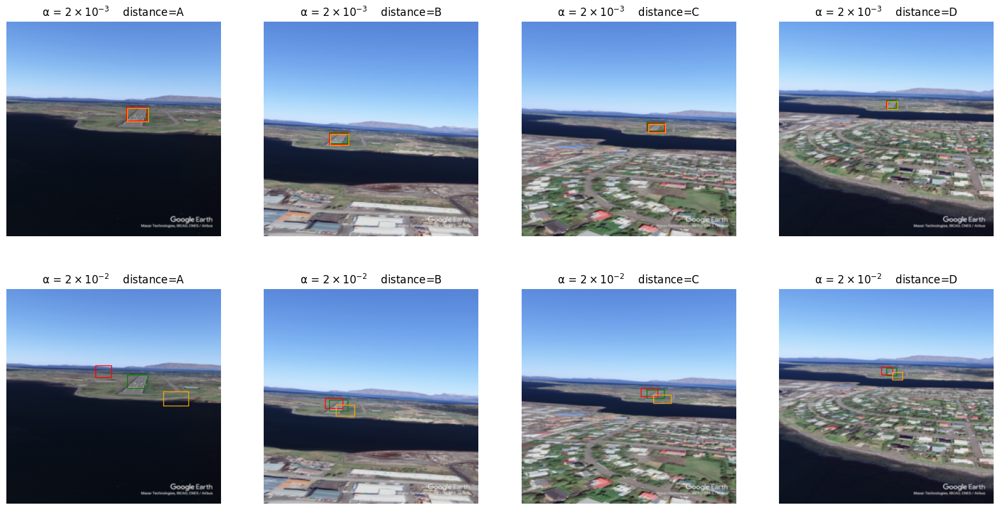

In [459]:
import matplotlib.pyplot
n = len(list_image_trajec)
fix, axes = plt.subplots(2, 4, figsize=(20,10))
subplot_index = 0
for i, img in enumerate(list_image_trajec_many): 
    row = i // 4
    col = i % 4
    axes[row, col].imshow(img)
    axes[row, col].axis('off')
    axes[row, col].set_title(f"{titles_pretty_[i]}")
plt.show()

In [327]:
b

[153.93146, 102.2357, 178.74521, 120.98955]

In [328]:
c

[156.5405, 103.46641, 181.94795, 122.5918]

In [352]:
5*15

75

In [355]:
for i in np.linspace(1, 100, 10):
    print(int(i))

1
12
23
34
45
56
67
78
89
100


## More pretty